In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# NOTEBOOK IMPORTS
import os, glob, warnings, pickle, re, traceback
import numpy as np
from shutil import copyfile
from datetime import datetime
from fuzzywuzzy import process
import easyocr

# IMAGE IMPORTS
from PIL import Image
import cv2

# GIS IMPORTS
from affinetransformation import *
from affine import Affine
import pandas as pd
import geopandas as gpd
import rasterio as rio

# IMAGE IMPORTS
# from skimage.morphology import skeletonize
# from skimage import img_as_bool, img_as_ubyte


# PLOTTING IMPORTS
import matplotlib.pyplot as plt

# CUSTOM UTILITIES
from IndexUtils import * 
from TileUtils import *
from TileNameFinder import *
from ReadDate import *
from featurematching import *

Image.MAX_IMAGE_PIXELS = 933120000
warnings.filterwarnings("ignore")
initialize = False

%matplotlib widget

c:\Users\fhacesga\Anaconda3\envs\yolo\lib\site-packages\geopandas\_compat.py:124: UserWarning: The Shapely GEOS version (3.11.2-CAPI-1.17.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
C:\Users\fhacesga\AppData\Local\Temp\ipykernel_14156\1811205482.py:17: DeprecationWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas still uses PyGEOS by default. However, starting with version 0.14, the default will switch to Shapely. To force to use Shapely 2.0 now, you can either uninstall PyGEOS or set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In the next release, GeoPandas will switch to using Shapely by default, even if PyGEOS is installed. If you only have PyGEOS installed to get speed-ups, this switch should be smooth. 

WARNING  Python>=3.10 is required, but Python==3.8.18 is currently installed 


IO directories depending on which machine. 

In [3]:
username = os.getlogin()

dnn_params = {}
dnn_params['CLNN'] = {}
dnn_params['TPNN'] = {}
dnn_params['RLNN'] = {}
dnn_params['FLNN'] = {}
dnn_params['TLNN'] = {}


if username == 'fhacesga':
    base_input_path   = r"D:\RECTDNN\uncompress_2\\"
    base_output_path  = r"D:\RECTDNN\processing\\"
    ref_dir  = r"C:\Users\fhacesga\OneDrive - University Of Houston\AAA_RECTDNN\data\AAA_ReferenceDatasets\\"
    tiled_yolo_model_paths = [
        r"C:\Users\fhacesga\OneDrive - University Of Houston\AAA_RECTDNN\data\CORNERS\CornersTiled_111324.pt",
        r"C:\Users\fhacesga\OneDrive - University Of Houston\AAA_RECTDNN\data\FANN\FANN_large_YOLO.pt"
    ]
elif username == 'fhace':
    base_input_path   = r"C:\Users\fhace\Desktop\FIRMs\data\Uncompress\\"
    ref_dir = r"C:\Users\fhace\Desktop\FIRMs\data\AAA_ReferenceDatasets\\"
    base_output_path = r"C:\Users\fhace\Desktop\FIRMs\data\Outputs\\"
    # dnn_params['TLNN']['model_weights']    = r"C:\Users\fhace\Desktop\FIRMs\data\BBNN\curr_weights.pt"
    dnn_params['CLNN']['model_checkpoint'] = r"C:\Users\fhace\Desktop\FIRMs\data\RLNN\checkpoint_101423.pth"
    dnn_params['TPNN']['model_checkpoint'] = r"C:\Users\fhace\OneDrive - University Of Houston\AAA_RECTDNN\data\TPNN\checkpoint_091523_pyramids_2.pth"
    dnn_params['RLNN']['model_checkpoint'] = r"C:\Users\fhace\OneDrive - University Of Houston\AAA_RECTDNN\data\RLNN\checkpoint_091323.pth"
    
else:
    base_input_path   = r"D:\Desktop\FIRMsDigitizing\data\HistoricalFIRMS"
    base_output_path  = r"D:\Desktop\FIRMsDigitizing\processing"
    ref_dir  = r"C:\Users\franc\OneDrive - University Of Houston\AAA_RECTDNN\data\AAA_ReferenceDatasets\\"

if not initialize:
    initialize = init_databases(ref_dir)

try:
    reader
except:
    reader = easyocr.Reader(['en']) 

In [4]:
proc_dir = r"C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\"

For each image we are processing, identify street corners

In [5]:
tiles = glob.glob(proc_dir + "tiles_goodstreets\*.tif")

In [6]:
out = processTiledYOLOs(tiles, tiled_yolo_model_paths, ['CornerCoordinates', 'street_corners'], proc_dir, imsizes=[256, 320])

Making images half size for tiled inference


  0%|          | 0/5 [00:00<?, ?it/s]

Reading from C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\CornerCoordinates.pkl
Reading from C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\street_corners.pkl


In [7]:
cornercoords_dict = out[0]
streetcorner_dict = out[1]

In [8]:
corners     = gpd.read_file(r"C:\Users\fhacesga\OneDrive - University Of Houston\AAA_RECTDNN\data\AAA_ReferenceDatasets\OSM_Roads\TexasRoads_filtered_strict_3857_nondupe_smaller_harris.gpkg")
roads_gdf   = gpd.read_file(r"C:\Users\fhacesga\Downloads\TexasRoads_filtered_strict_3857.gpkg", engine='pyogrio', use_arrow=True)

In [9]:
corner_dir = os.path.join(get_largest_subdirectory(os.path.join(proc_dir, "street_corners")), "pickles")

if os.path.isdir(os.path.join(proc_dir, "focus")):
    referencing_dir  =  os.path.join(proc_dir, "focus") + "\\"
    print(f"Focus found, using {referencing_dir}")

registration_dir = os.path.join(proc_dir, "registration")
os.makedirs(registration_dir, exist_ok=True)

print(corner_dir)

C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\street_corners\exp2\pickles


In [10]:
np.set_printoptions(precision=8) 

In [11]:
def normCoords(A, B):
    offsets = np.min(A, axis=0)
    return A - offsets, B - offsets

def updateResults_old(list1, list2, compare_idx=8):
    combined_dict = {}
    
    # Add elements from list1, prioritizing these tuples initially
    for tup in list1:
        key = (tup[0], tup[1])  # A and B are used as the key
        if key not in combined_dict:
            combined_dict[key] = tup
    
    # Add or update elements from list2
    for tup in list2:
        key = (tup[0], tup[1])  # A and B are used as the key
        # Replace the tuple if the key exists and G in list2's tuple is greater
        
        if key in combined_dict:
            print_val = combined_dict[key][compare_idx][0]
        else:
            print_val = None
        # print(key, key in combined_dict, tup[compare_idx][0], print_val)
        if key not in combined_dict:
            combined_dict[key] = tup
        elif key in combined_dict and tup[compare_idx][0] < combined_dict[key][compare_idx][0]:
            combined_dict[key] = tup
                
    # Convert the dictionary back to a list
    combined_list = list(combined_dict.values())

    print(len(list1), len(list2), len(combined_list))
    return combined_list

def updateResults(list1, list2):
    combined_dict = {}
    all_matches = list1 + list2

    for tup in all_matches:
        key = tup[0]  # one match per reference descriptor

        try:
            current_ratio = tup[2] / tup[3]
        except ZeroDivisionError:
            continue  # skip bad matches

        if key not in combined_dict:
            combined_dict[key] = tup
        else:
            prev = combined_dict[key]
            prev_ratio = prev[2] / prev[3]
            if current_ratio < prev_ratio:
                combined_dict[key] = tup

    combined_list = list(combined_dict.values())
    print(len(list1), len(list2), len(combined_list))
    return combined_list


def most_popular_indices(values, eps=0.1):
    # RETURN TO featurematching.py
    # Convert values to a 2D array as required by DBSCAN
    values_2d = np.array(values).reshape(-1, 1)
    
    # Cluster the values using DBSCAN
    db = DBSCAN(eps=eps, min_samples=2).fit(values_2d)
    
    # Find the most common cluster label, ignoring noise (-1 label)
    labels, counts = np.unique(db.labels_[db.labels_ != -1], return_counts=True)
    if len(counts) == 0:
        return []  # No clusters found

    most_common_label = labels[np.argmax(counts)]
    
    # Get indices of values in the most common cluster
    indices = [i for i, label in enumerate(db.labels_) if label == most_common_label]
    
    return indices

def most_popular_indices_2d(points, eps=0.1):
    # Convert the list of 2D points to a numpy array
    points_array = np.array(points)
    
    # Cluster the points using DBSCAN
    db = DBSCAN(eps=eps, min_samples=2).fit(points_array)
    
    # Find the most common cluster label, ignoring noise (-1 label)
    labels, counts = np.unique(db.labels_[db.labels_ != -1], return_counts=True)
    if len(counts) == 0:
        return []  # No clusters found
    
    print("THESE ARE THE DBSCAN COUNTS")
    print(counts)
    
    most_common_label = labels[np.argmax(counts)]
    
    # Get indices of points in the most common cluster
    indices = [i for i, label in enumerate(db.labels_) if label == most_common_label]
    
    return indices

def most_popular_indices_2d_flexible(uv_vectors, eps=0.1, iteration=0, n_iters=10, min_cluster_size=10):
    """
    uv_vectors: np.ndarray of shape (N, 2) representing delta vectors (dx, dy)
    eps: base clustering threshold (in normalized space)
    iteration: current iteration index (0-based)
    n_iters: total iterations expected
    """
    # Compute angle and magnitude
    angles = np.degrees(np.arctan2(uv_vectors[:, 1], uv_vectors[:, 0])) % 360
    magnitudes = np.linalg.norm(uv_vectors, axis=1)

    # Normalize
    angle_norm = angles / 360.0  # 0–1
    length_norm = magnitudes / (np.max(magnitudes) + 1e-6)

    # Decay angle weight as we get closer to convergence
    angle_weight = max(1 - (iteration / n_iters), 0.1)
    length_weight = 1.0

    combined = np.vstack([
        angle_norm * angle_weight,
        length_norm * length_weight
    ]).T

    db = DBSCAN(eps=eps, min_samples=2).fit(combined)
    labels, counts = np.unique(db.labels_[db.labels_ != -1], return_counts=True)

    if len(counts) == 0:
        return []

    # Keep all clusters with sufficient support
    good_clusters = [label for label, count in zip(labels, counts) if count >= min_cluster_size]

    indices = [i for i, label in enumerate(db.labels_) if label in good_clusters]
    return indices



def adjustFromMatchingV2(matchresults, corners_curr=None, idx=None, im_corner_gdf=None, plot=False, verbose=False, dbscan_eps=0.04, logging_dir=None, filter_topn=None):

    if filter_topn is not None:
        print(f"Filtering top {filter_topn}")
        conf = [a[8][0] / a[8][1] for a in matchresults]
        indices = np.argsort(conf)[:filter_topn]
        matchresults = [matchresults[a] for a in indices]

    if idx is None:
        idx = np.arange(len(matchresults), dtype=np.int32)
    
    fromPoints = gpd.GeoDataFrame(geometry=gpd.points_from_xy([x[4][0] for x in matchresults], [x[4][1] for x in matchresults]))
    toPoints   = gpd.GeoDataFrame(geometry=gpd.points_from_xy([x[5][0] for x in matchresults], [x[5][1] for x in matchresults]))

    coordsA = getCoordsGDF(fromPoints)
    coordsB = getCoordsGDF(toPoints)

    i = 0

    checker = True
    prev = np.where(idx)[0].shape[0]

    if logging_dir is not None:
        fig, axs, _, _ = plotMatches(fromPoints, toPoints, dbscan_eps=dbscan_eps)
        fig.savefig(logging_dir)
        if not plot:
            plt.close(fig)
        else:
            plt.show()
    
    while checker and i < 2:
        
        initial = affineTransformation(coordsA[idx, 0], coordsA[idx, 1], coordsB[idx, 0], coordsB[idx, 1],verbose=False, )
        matrix = initial.matrix        
        coordsBprime = np.hstack((coordsB[idx], np.ones((coordsB[idx].shape[0], 1)))) @ np.linalg.inv(matrix).T
        distances = np.sqrt((coordsBprime[:, 0] - coordsA[idx, 0]) ** 2 + (coordsBprime[:, 1] - coordsA[idx, 1]) ** 2)
        uv = coordsB - coordsA
        angles = np.degrees(np.arctan2(uv[:, 1], uv[:, 0]))
        test = np.vstack((normArry(angles), normArry(np.sqrt(uv[:, 0] ** 2, uv[:, 1] ** 2 )))).T
        test[np.isnan(test)] = 0
        db_idx = most_popular_indices_2d(test, eps=dbscan_eps)

        dist_idx = np.where(distances <= 3 * np.median(distances))[0]
        idx = np.intersect1d(idx, dist_idx, db_idx)

        print(idx.shape, dist_idx.shape, len(db_idx), np.median(distances))
        

        counter = 0
        if np.where(idx)[0].shape[0] < 10:
            print("Loosening, under 10... ", end=" ")
            while np.where(idx)[0].shape[0] < 10:
                counter = counter + 1
                idx = most_popular_indices_2d(test, eps=dbscan_eps + 0.02 * counter)
                if counter > 10:
                    break
            print(f"Loosened {counter} times at {dbscan_eps + 0.02 * counter}")
        
        if np.where(idx)[0].shape[0] < prev:
            prev = np.where(idx)[0].shape[0]
        else: 
            checker = False
        
        if verbose:
            print(i)
            print(np.linalg.inv(matrix).T)
            fig, axs = plt.subplots(1, 2)
            axs[0].scatter(coordsA[idx, 0], coordsA[idx, 1], color='black')
            axs[0].scatter(coordsB[idx, 0], coordsB[idx, 1])
            axs[0].scatter(coordsBprime[:, 0], coordsBprime[:, 1], marker='x')
            axs[1].hist(distances[idx], bins=50)
            axs[1].set_title(f"Iteration {i}")
            fig.savefig(logging_dir[:-3] + f"internalremovals_iteration{i}.jpg")
            if not plot:
                plt.close(fig)
            else:
                plt.show()

        i = i + 1

    return matrix, distances[idx], idx

def registerImagesV2(ra, im_corner_gdf, corners_curr, corner_arry, descriptor_kwds, 
                     r_initial=500, 
                     verbose=1, 
                     distance_threshold=10,
                     n_iters=20,
                     r_change=0.6,
                     dbscan_ini=0.04,
                     logging_dir=None,
                     remove_stdev=True
                     ):
    compoundedAdjustment = np.eye(3)
    flip=np.array([
        [1, 0, 0],
        [0, -1, 0],
        [0, 0, 1]
        ]) 
    
    os.makedirs(logging_dir, exist_ok=True)
    logging_basename = os.path.join(logging_dir, os.path.basename(ra.files[0]).split(".")[0])

    logging_struct = {}

    matching_results = None
    im_corner_gdf_adj = im_corner_gdf.copy()

    registration_struct = {}
    registration_struct['best_grade']       = 1e9
    registration_struct['best_transform']   = None
    registration_struct['grades']           = []
    registration_struct['transforms']       = []
    registration_struct['points']           = []


    for i in range(n_iters):

        logging_struct[i] = {}
        
        # r_current = r_initial * 0.95 ** i
        r_current = r_initial * r_change ** i
        dbscan_curr = dbscan_ini + dbscan_ini * i
            
        matching_results_curr, _, _ = matching_distances_loosen_distance(im_corner_gdf_adj, corners_curr, ratio_threshold=0., 
                                                                    match_radius=r_current, 
                                                                    num_retries=10,
                                                                    loosening_factor=0.25, 
                                                                    **descriptor_kwds)
        
        if matching_results is None:
            matching_results = matching_results_curr
        else:
            print("UPDATING RESULTS", print(len(matching_results)))
            matching_results = updateResults(matching_results, matching_results_curr)
            print(len(matching_results))
        
        if len(matching_results) < 3:
            raise(Exception(f"Cannot match: {len(matching_results)} matches found for {os.path.basename(ra.files[0])}"))
        
        matrix, distances, idx = adjustFromMatchingV2(matching_results, plot=verbose>8, 
                                                        dbscan_eps=dbscan_curr,
                                                        verbose=verbose>8,
                                                        # filter_topn=100,
                                                        logging_dir=None if logging_dir is None else logging_basename + f"_iteration{str(i).zfill(2)}.jpg")
        
        matching_results = [matching_results[i] for i in idx]

        print(len(matching_results))

        logging_struct[i]["matching_results"]   = matching_results
        logging_struct[i]["distances"]          = distances

        current_adjustment      = np.linalg.inv(matrix) @ getMatrixFromAffine(ra.transform)

        reprojectedcorners = np.hstack((corner_arry, np.ones((corner_arry.shape[0], 1)))) @ current_adjustment.T

        scale       = np.sqrt(0.5 * (matrix[0,0] ** 2 + matrix[1,1] ** 2))
        translation = np.sqrt(matrix[0,2] ** 2 + matrix[1,2] ** 2)
        conv_check  = np.abs(1 - scale) < 0.002 and translation < distance_threshold

        if verbose > 3:
            print(f"Scale {scale:.3e}")
            print(f"Translation {translation:.3e}")
            print(conv_check)
            print(np.linalg.inv(matrix))
            print("Inverse")
            print(np.linalg.inv(np.linalg.inv(matrix)))

        if verbose > 5:
            fig, ax  = plt.subplots()
            ax.scatter(reprojectedcorners[:, 0], reprojectedcorners[:, 1], label="Reprojected Corners")

            original_image_corners = np.hstack((corner_arry, np.ones((corner_arry.shape[0], 1)))) @  getMatrixFromAffine(ra.transform).T
            ax.scatter(original_image_corners[:, 0], original_image_corners[:, 1], label="Original Image Corners")

            # READ MATCHING RESULTS AND GET DATABASE (TARGET?)
            db_corners_x = np.array([m[5][0] for m in matching_results])
            db_corners_y = np.array([m[5][1] for m in matching_results])
            ax.scatter(db_corners_x, db_corners_y, label="Matching - Image Corners")

            # READ MATCHING RESULTS AND GET DETECTIONS (REFERENCE?)
            r_corners_x = np.array([m[4][0] for m in matching_results])
            r_corners_y = np.array([m[4][1] for m in matching_results])
            ax.scatter(r_corners_x, r_corners_y, label="Matching - Database Corners")

            ax, _ = calcQuiver(ax, 
                       gpd.GeoDataFrame(geometry=gpd.points_from_xy(db_corners_x, db_corners_y)),
                       gpd.GeoDataFrame(geometry=gpd.points_from_xy(r_corners_x, r_corners_y)), )

            try:
                cx.add_basemap(ax, zoom_adjust=1)
            except:
                print("Error adding basemap")
            ax.legend()
            plt.show()

        im_corner_gdf_adj['geometry'] = gpd.points_from_xy(reprojectedcorners[:,0], reprojectedcorners[:, 1])

        if verbose > 0:
            print(np.nanpercentile(distances, [0, 25, 50, 75, 100]), len(matching_results))

        # CHECK IF WE HAVE CORRECT DISTANCE
        matched_check = np.nanpercentile(distances, 50) < distance_threshold # and distances.shape[0] > 10

        # IF BEST, SAVE AS BEST
        if np.nanpercentile(distances, 50) < registration_struct['best_grade']:
            registration_struct['best_grade']       = np.nanpercentile(distances, 50)
            registration_struct['best_transform']   = current_adjustment
            registration_struct['best_im_corner_gdf_adj']    = im_corner_gdf_adj

        # SAVE CURRENT TIMESTEP VALUES
        registration_struct[i] = {}
        registration_struct[i]['grade']     = np.nanpercentile(distances, 50)
        registration_struct[i]['transform'] = current_adjustment
        registration_struct[i]['im_corner_gdf_adj'] = im_corner_gdf_adj

        if (matched_check or conv_check) and i > 1:
            print(matched_check, conv_check)
            break

    logging_struct['registration_struct'] = registration_struct
    with open(logging_basename+".pkl", 'wb') as handle:
        pickle.dump(logging_struct, handle, protocol=pickle.HIGHEST_PROTOCOL)       

    return registration_struct['best_transform'] , registration_struct['best_im_corner_gdf_adj']


In [12]:
"""coordsA = gcps[['image_X', 'image_Y']].to_numpy()
coordsB = gcps[['X', 'Y']].to_numpy()

initial = similarityTransformation(coordsA[:, 0], coordsA[:, 1], coordsB[:, 0], coordsB[:, 1],verbose=True)
matrix = initial.matrix    

coordsBprime = np.hstack((coordsB, np.ones((coordsB.shape[0], 1)))) @ np.linalg.inv(matrix).T    

# distances = np.sum(coordsBprime - coordsA)
distances = np.sqrt((coordsBprime[:, 0] - coordsA[:, 0]) ** 2 + (coordsBprime[:, 1] - coordsA[:, 1]) ** 2)

print(matrix)
print(coordsA[:, 0], coordsA[:, 1], coordsB[:, 0], coordsB[:, 1])"""

"coordsA = gcps[['image_X', 'image_Y']].to_numpy()\ncoordsB = gcps[['X', 'Y']].to_numpy()\n\ninitial = similarityTransformation(coordsA[:, 0], coordsA[:, 1], coordsB[:, 0], coordsB[:, 1],verbose=True)\nmatrix = initial.matrix    \n\ncoordsBprime = np.hstack((coordsB, np.ones((coordsB.shape[0], 1)))) @ np.linalg.inv(matrix).T    \n\n# distances = np.sum(coordsBprime - coordsA)\ndistances = np.sqrt((coordsBprime[:, 0] - coordsA[:, 0]) ** 2 + (coordsBprime[:, 1] - coordsA[:, 1]) ** 2)\n\nprint(matrix)\nprint(coordsA[:, 0], coordsA[:, 1], coordsB[:, 0], coordsB[:, 1])"

In [13]:
"""
gcps = loadGCPs(os.path.join(curr_dir, "gcps.csv"), tile_dirs, ra_ref)

dist =  gcps[['image_X', 'image_Y']].to_numpy() - gcps[['X', 'Y']].to_numpy()

print(dist)

plt.figure()
plt.scatter(gcps[['image_X']],gcps[['image_Y']], label="Calculated")
plt.scatter(gcps[['X']],gcps[['Y']], label="GCP")
plt.scatter(coordsBprime[:, 0],coordsBprime[:, 1], marker='x', label="Transformed B")
plt.scatter(coordsAprime[:, 0],coordsAprime[:, 1], marker='x', label="Transformed A")

for i, n in gcps.iterrows():
    # print(i, n)
    # print(coordsA[i, 0], coordsA[i, 1], coordsB[i, 0], coordsB[i, 1])
    # print(gcps[['image_X', 'image_Y']].iloc[i, :])
    plt.annotate(f"{i}", (n['X'], n['Y']))
    plt.annotate(f"{i}", (n[['image_X']],n[['image_Y']]))

plt.legend()"""
# plt.quiver(coordsA[:, 0],coordsA[:, 1], dist[:, 0],dist[:, 1],)

'\ngcps = loadGCPs(os.path.join(curr_dir, "gcps.csv"), tile_dirs, ra_ref)\n\ndist =  gcps[[\'image_X\', \'image_Y\']].to_numpy() - gcps[[\'X\', \'Y\']].to_numpy()\n\nprint(dist)\n\nplt.figure()\nplt.scatter(gcps[[\'image_X\']],gcps[[\'image_Y\']], label="Calculated")\nplt.scatter(gcps[[\'X\']],gcps[[\'Y\']], label="GCP")\nplt.scatter(coordsBprime[:, 0],coordsBprime[:, 1], marker=\'x\', label="Transformed B")\nplt.scatter(coordsAprime[:, 0],coordsAprime[:, 1], marker=\'x\', label="Transformed A")\n\nfor i, n in gcps.iterrows():\n    # print(i, n)\n    # print(coordsA[i, 0], coordsA[i, 1], coordsB[i, 0], coordsB[i, 1])\n    # print(gcps[[\'image_X\', \'image_Y\']].iloc[i, :])\n    plt.annotate(f"{i}", (n[\'X\'], n[\'Y\']))\n    plt.annotate(f"{i}", (n[[\'image_X\']],n[[\'image_Y\']]))\n\nplt.legend()'

In [14]:
def most_popular_indices_2d_v1(points, eps=0.1, auto_include=10):
    # Convert the list of 2D points to a numpy array
    points_array = np.array(points)
    
    # Cluster the points using DBSCAN
    db = DBSCAN(eps=eps, min_samples=2).fit(points_array)
    
    # Find the most common cluster label, ignoring noise (-1 label)
    labels, counts = np.unique(db.labels_[db.labels_ != -1], return_counts=True)
    if len(counts) == 0:
        return []  # No clusters found
    
    print("THESE ARE THE DBSCAN COUNTS")
    print(counts)

    goodlabels = [a for a in labels[np.max(counts) == counts]]
    goodlabels.extend([a for a in labels[counts > auto_include]])
    
    # Get indices of points in the most common cluster
    indices = [i for i, label in enumerate(db.labels_) if label in goodlabels]

    return indices

def plotMatches(fromPoints, toPoints, dbscan_eps=0.04):
    fig, axs = plt.subplots(1, 2, figsize=(15,5))

    fromPoints.plot(ax=axs[0])
    toPoints.plot(ax=axs[0])
    axs[0], uv = calcQuiver(axs[0], fromPoints, toPoints, color="black")

    try:
        cx.add_basemap(axs[0])
    except:
        print("Error adding Basemap")

    angles = np.degrees(np.arctan2(uv[:, 1], uv[:, 0]))
    angle_mean = np.nanmean(angles)
    angles = angles - angle_mean
    test = np.vstack((normArry(angles), normArry(np.sqrt(uv[:, 0] ** 2 + uv[:, 1] ** 2 )))).T
    # idx = most_popular_indices_2d_v1(test, eps=dbscan_eps)
    idx = most_popular_indices_2d_flexible(test, eps=dbscan_eps, iteration=iteration_struct[0], n_iters=iteration_struct[1],)

    axs[0], uv = calcQuiver(axs[0], fromPoints.iloc[idx], toPoints.iloc[idx], color="yellow")

    bins = np.linspace(-180, 180, 100)

    axs[1].hist(angles + angle_mean, bins, label="All")
    axs[1].hist(angles[idx] + angle_mean, bins, label="Selected")
    axs[1].set_xlabel("Adjustment Bearing")
    axs[1].set_ylabel("Frequency (n)")

    return fig, axs, uv, idx

def plotMatchesNew(fromPoints, toPoints, idx, coordsBPrime=None, add_basemap=True):
    """
    Plots original and matched points, their directional vectors, and angle histogram.
    `idx` should be the final filtered indices to highlight in yellow.
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import contextily as cx

    fig, axs = plt.subplots(1, 2, figsize=(15, 5))

    # Plot all points
    fromPoints.plot(ax=axs[0], color='lightgray', markersize=5)
    toPoints.plot(ax=axs[0], color='darkgray', markersize=5)

    # Full vector field
    axs[0], uv = calcQuiver(axs[0], fromPoints, toPoints, color="black")

    # Add basemap (optional)
    if add_basemap:
        try:
            cx.add_basemap(axs[0])
        except:
            print("Error adding Basemap")

    # Compute angles and magnitudes
    angles = np.degrees(np.arctan2(uv[:, 1], uv[:, 0]))
    angle_mean = np.nanmean(angles)
    centered_angles = angles - angle_mean
    magnitudes = np.sqrt(uv[:, 0]**2 + uv[:, 1]**2)
    test = np.vstack((normArry(centered_angles), normArry(magnitudes))).T

    # Highlight final filtered matches
    axs[0], uv_filtered = calcQuiver(axs[0], fromPoints.iloc[idx], toPoints.iloc[idx], color="yellow")

    axs[0].scatter(coordsBPrime[:, 0], coordsBPrime[:, 1], marker='x', c='red', label='B warped')

    # Angle histograms
    bins = np.linspace(-180, 180, 100)
    axs[1].hist(angles, bins, label="All", alpha=0.5)
    axs[1].hist(angles[idx], bins, label="Filtered", color="orange", alpha=0.7)
    axs[1].set_xlabel("Adjustment Bearing (degrees)")
    axs[1].set_ylabel("Frequency (n)")
    axs[1].legend()

    return fig, axs, uv_filtered, idx

def addGCPsandIndices_old(coordsA, coordsB, idx, gcps):
    if gcps is None:
        newA = coordsA[:, idx]
        newB = coordsB[:, idx]
    else:
        newA = np.vstack((coordsA[idx, :], gcps[['image_X', 'image_Y']].to_numpy()))
        newB = np.vstack((coordsB[idx, :], gcps[['X', 'Y']].to_numpy()))
        print(newA)
        print(newB)
    return newA, newB

def addGCPsandIndices(coordsA, coordsB, idx, gcps):
    if gcps is None:
        newA = coordsA[idx, :]
        newB = coordsB[idx, :]
    else:
        newA = np.vstack((coordsA[idx, :], gcps[['image_X', 'image_Y']].to_numpy()))
        newB = np.vstack((coordsB[idx, :], gcps[['X', 'Y']].to_numpy()))
        print(newA)
        print(newB)
    return newA, newB

def adjustGCPs(gcps):
    coordsA = gcps[['image_X', 'image_Y']].to_numpy()
    coordsB = gcps[['X', 'Y']].to_numpy()
    initial = similarityTransformation(coordsA[:, 0], coordsA[:, 1], coordsB[:, 0], coordsB[:, 1],verbose=False)
    matrix = initial.matrix
    coordsBprime = np.hstack((coordsB, np.ones((coordsB.shape[0], 1)))) @ np.linalg.inv(matrix).T    
    coordsAprime = np.hstack((coordsA, np.ones((coordsA.shape[0], 1)))) @ matrix.T    

    distances = np.sqrt((coordsBprime[:, 0] - coordsA[:, 0]) ** 2 + (coordsBprime[:, 1] - coordsA[:, 1]) ** 2)
    print(distances)
    return matrix, distances, distances > -10000

def adjustFromMatchingV3(matchresults, 
                         corners_curr=None, 
                         idx=None, 
                         im_corner_gdf=None, 
                         plot=False, 
                         verbose=False, 
                         dbscan_eps=0.04, 
                         logging_dir=None, 
                         iteration_struct=(0, 10),
                         filter_topn=None, 
                         distance_thresh=None,
                         gcps=None
                         ):

    if filter_topn is not None:
        print(f"Filtering top {filter_topn}")
        conf = [a[8][0] / a[8][1] for a in matchresults]
        indices = np.argsort(conf)[:filter_topn]
        matchresults = [matchresults[a] for a in indices]

    if idx is None:
        idx = np.arange(len(matchresults), dtype=np.int32)
    
    fromPoints = gpd.GeoDataFrame(geometry=gpd.points_from_xy([x[4][0] for x in matchresults], [x[4][1] for x in matchresults]))
    toPoints   = gpd.GeoDataFrame(geometry=gpd.points_from_xy([x[5][0] for x in matchresults], [x[5][1] for x in matchresults]))

    coordsA = getCoordsGDF(fromPoints)
    coordsB = getCoordsGDF(toPoints)

    i = 0

    checker = True
    prev = np.where(idx)[0].shape[0]

    if logging_dir is not None:
        fig, axs, _, _ = plotMatches(fromPoints, toPoints, dbscan_eps=dbscan_eps)
        fig.savefig(logging_dir)
        if not plot:
            plt.close(fig)
        else:
            plt.show()
    
    while checker and i < 2:
        if gcps is not None:
            coordsA, coordsB = addGCPsandIndices(coordsA, coordsB, idx, gcps)
        initial = similarityTransformation(coordsA[:, 0], coordsA[:, 1], coordsB[:, 0], coordsB[:, 1],verbose=False)
        matrix = initial.matrix        
        coordsBprime = np.hstack((coordsB[idx], np.ones((coordsB[idx].shape[0], 1)))) @ np.linalg.inv(matrix).T
        distances = np.sqrt((coordsBprime[:, 0] - coordsA[idx, 0]) ** 2 + (coordsBprime[:, 1] - coordsA[idx, 1]) ** 2)
        uv = coordsB - coordsA
        angles = np.degrees(np.arctan2(uv[:, 1], uv[:, 0]))
        test = np.vstack((normArry(angles), normArry(np.sqrt(uv[:, 0] ** 2, uv[:, 1] ** 2 )))).T
        test[np.isnan(test)] = 0
        # db_idx = most_popular_indices_2d_v1(test, eps=dbscan_eps)
        db_idx = most_popular_indices_2d_flexible(test, eps=dbscan_eps, iteration=iteration_struct[0], n_iters=iteration_struct[1],)

        dist_idx = np.where(distances <= 3 * np.median(distances))[0]
        idx = np.intersect1d(idx, dist_idx, db_idx)

        print(idx.shape, dist_idx.shape, len(db_idx), np.median(distances))
        

        counter = 0
        if np.where(idx)[0].shape[0] < 10:
            print("Loosening, under 10... ", end=" ")
            while np.where(idx)[0].shape[0] < 10:
                counter = counter + 1
                idx = most_popular_indices_2d_v1(test, eps=dbscan_eps + 0.02 * counter)
                if counter > 10:
                    break
            print(f"Loosened {counter} times at {dbscan_eps + 0.02 * counter}")
        
        if np.where(idx)[0].shape[0] < prev:
            prev = np.where(idx)[0].shape[0]
        else: 
            checker = False
        
        if verbose:
            print(i)
            print(np.linalg.inv(matrix).T)
            fig, axs = plt.subplots(1, 2)
            axs[0].scatter(coordsA[idx, 0], coordsA[idx, 1], color='black')
            axs[0].scatter(coordsB[idx, 0], coordsB[idx, 1])
            axs[0].scatter(coordsBprime[:, 0], coordsBprime[:, 1], marker='x')
            axs[1].hist(distances[idx], bins=50)
            axs[1].set_title(f"Iteration {i}")
            fig.savefig(logging_dir[:-3] + f"internalremovals_iteration{i}.jpg")
            if not plot:
                plt.close(fig)
            else:
                plt.show()

        i = i + 1

    

    if distance_thresh is not None:
        print("APPLYING DISTANCE THRESHOLD")
        print(distances.shape)
        # print(distances)
        distances = distances[idx]
        # print(distances)
        # print(idx)
        idx = idx[distances < distance_thresh]
        # print(idx)
        print(distances.shape)
        distances = distances[distances < distance_thresh]
        
    else:
        distances = distances[idx]

    return matrix, distances, idx

def adjustFromMatchingV4(matchresults, 
                         corners_curr=None, 
                         idx=None, 
                         im_corner_gdf=None, 
                         plot=False, 
                         verbose=False, 
                         dbscan_eps=0.04, 
                         logging_dir=None, 
                         iteration_struct=(0, 10),
                         filter_topn=None, 
                         distance_thresh=None,
                         gcps=None):
    
    # Optional confidence filtering
    if filter_topn is not None:
        print(f"Filtering top {filter_topn}")
        conf = [a[8][0] / a[8][1] for a in matchresults]
        indices = np.argsort(conf)[:filter_topn]
        matchresults = [matchresults[i] for i in indices]

    if idx is None:
        idx = np.arange(len(matchresults), dtype=np.int32)

    # Convert matches to GeoDataFrames
    fromPoints = gpd.GeoDataFrame(geometry=gpd.points_from_xy(
        [x[4][0] for x in matchresults], [x[4][1] for x in matchresults]))
    toPoints = gpd.GeoDataFrame(geometry=gpd.points_from_xy(
        [x[5][0] for x in matchresults], [x[5][1] for x in matchresults]))

    coordsA = getCoordsGDF(fromPoints)
    coordsB = getCoordsGDF(toPoints)

    # Iterative refinement loop
    i, checker = 0, True
    prev_len = len(idx)

    while checker and i < 10:
        # Re-inject GCPs each round

        print(coordsA.shape)
        print(coordsB.shape)
        print(idx.shape)

        coordsA_aug, coordsB_aug = addGCPsandIndices(coordsA, coordsB, idx, gcps)

        # Estimate similarity transform
        transform = similarityTransformation(
            coordsA_aug[:, 0], coordsA_aug[:, 1],
            coordsB_aug[:, 0], coordsB_aug[:, 1],
            verbose=False
        )
        matrix = transform.matrix

        # Transform current coordinates
        coordsBprime = np.hstack((coordsB[idx], np.ones((len(idx), 1)))) @ np.linalg.inv(matrix).T

        # Euclidean error
        distances = np.linalg.norm(coordsBprime[:, :2] - coordsA[idx], axis=1)

        # Compute angular and magnitude features
        uv = coordsB - coordsA
        angles = np.degrees(np.arctan2(uv[:, 1], uv[:, 0]))
        magnitudes = np.sqrt(uv[:, 0] ** 2 + uv[:, 1] ** 2)
        test = np.vstack((normArry(angles), normArry(magnitudes))).T
        test[np.isnan(test)] = 0

        # DBSCAN-based filtering
        db_idx = most_popular_indices_2d_flexible(
            test, eps=dbscan_eps, iteration=iteration_struct[0], n_iters=iteration_struct[1])

        # Distance-based filtering
        dist_thresh = 3 * np.median(distances)
        dist_idx = np.where(distances <= dist_thresh)[0]

        # Combine filters
        idx = np.intersect1d(idx, dist_idx, db_idx)

        # Relax filter if too few remain
        if len(idx) < 10:
            print("Loosening DBSCAN... ", end="")
            for j in range(1, 11):
                temp_idx = most_popular_indices_2d_flexible(
                    test, eps=dbscan_eps + 0.02 * j,
                    iteration=iteration_struct[0], n_iters=iteration_struct[1])
                if len(temp_idx) >= 10:
                    idx = np.intersect1d(idx, temp_idx)
                    print(f"Loosened to eps={dbscan_eps + 0.02 * j}")
                    break

        # Stop if convergence
        if len(idx) >= prev_len:
            checker = False
        else:
            prev_len = len(idx)

        # Optional debug plot
        if verbose:
            print(f"Iteration {i}, matrix:\n{np.linalg.inv(matrix).T}")
            fig, axs = plt.subplots(1, 2, figsize=(10, 4))
            axs[0].scatter(coordsA[idx, 0], coordsA[idx, 1], c='black', label='A')
            axs[0].scatter(coordsB[idx, 0], coordsB[idx, 1], c='blue', label='B')
            axs[0].scatter(coordsBprime[:, 0], coordsBprime[:, 1], marker='x', c='red', label='B warped')
            axs[0].legend()
            axs[1].hist(distances, bins=50)
            axs[1].set_title(f"Residuals (iter {i})")
            fig.savefig(logging_dir[:-3] + f"_iteration{i}.jpg")
            if not plot:
                plt.close(fig)
            else:
                plt.show()

        i += 1

    # Final distance threshold (optional)
    if distance_thresh is not None:
        print("APPLYING DISTANCE THRESHOLD")
        print(distances.shape)
        distances = distances[idx]
        idx = idx[distances < distance_thresh]
        print(distances.shape)
        distances = distances[distances < distance_thresh]
    
    # Optional initial plot
    if logging_dir is not None:
        fig, axs, _, _ = plotMatchesNew(fromPoints, toPoints, idx=idx, coordsBPrime=coordsBprime)
        fig.savefig(logging_dir)
        if not plot:
            plt.close(fig)
        else:
            plt.show()


    return matrix, distances, idx

def apply_matrix_to_gdf(gdf, M):
    """Apply 3×3 affine (homogeneous) matrix M to a GeoDataFrame of points."""
    xy1   = np.vstack([gdf.geometry.x, gdf.geometry.y, np.ones(len(gdf))])
    xy1_t = M @ xy1
    return gpd.GeoDataFrame(geometry=gpd.points_from_xy(xy1_t[0], xy1_t[1]), crs=gdf.crs)


def registerImagesV2_group(group_name, im_corner_gdf, corners_curr, corner_arry, descriptor_kwds, 
                     r_initial=500, 
                     verbose=1, 
                     distance_threshold=10,
                     n_iters=20,
                     r_change=0.6,
                     ratio_threshold=0.9,
                     dbscan_ini=0.04,
                     dbscan_max=0.1,
                     gcps=None,
                     logging_dir=None,
                     remove_stdev=True
                     ):
    compoundedAdjustment = np.eye(3)
    flip=np.array([
        [1, 0, 0],
        [0, -1, 0],
        [0, 0, 1]
        ]) 
    
    os.makedirs(logging_dir, exist_ok=True)
    logging_basename = os.path.join(logging_dir, group_name)

    logging_struct = {}

    matching_results = None
    im_corner_gdf_adj = im_corner_gdf.copy()

    registration_struct = {}
    registration_struct['best_grade']       = 1e9
    registration_struct['best_transform']   = None
    registration_struct['grades']           = []
    registration_struct['transforms']       = []
    registration_struct['points']           = []

    for i in range(n_iters):

        logging_struct[i] = {}
        
        # r_current = r_initial * 0.95 ** i
        r_current = r_initial * r_change ** i
        dbscan_curr = dbscan_ini + dbscan_ini * i
        if dbscan_curr > dbscan_max:
            dbscan_max = dbscan_curr
            
        matching_results_curr, _, _ = matching_distances_loosen_distance(im_corner_gdf_adj, corners_curr, 
                                                                    ratio_threshold=ratio_threshold, 
                                                                    match_radius=r_current, 
                                                                    num_retries=10,
                                                                    loosening_factor=0.25,
                                                                    quality_weight=0.5, 
                                                                    **descriptor_kwds)
        
        if matching_results is None:
            matching_results = matching_results_curr
        else:
            print("UPDATING RESULTS", len(matching_results))
            matching_results = updateResults(matching_results, matching_results_curr)
            print(len(matching_results))
        
        if len(matching_results) < 3:
            raise(Exception(f"Cannot match: {len(matching_results)} matches found for {os.path.basename(ra.files[0])}"))
        
        if i == 0 and gcps is not None:
            matrix, distances, idx = adjustGCPs(gcps)
        else:
            matrix, distances, idx = adjustFromMatchingV4(matching_results, plot=verbose>8, 
                                                        dbscan_eps=dbscan_curr,
                                                        verbose=verbose>8,
                                                        gcps=gcps,
                                                        distance_thresh=r_current,
                                                        iteration_struct = (i, n_iters),
                                                        logging_dir=None if logging_dir is None else logging_basename + f"_iteration{str(i).zfill(2)}.jpg")
        
            matching_results = [matching_results[i] for i in idx]

            print(len(matching_results))

            logging_struct[i]["matching_results"]   = matching_results
        logging_struct[i]["distances"]          = distances

        # current_transformation  = np.linalg.inv(matrix) @ getMatrixFromAffine(ra.transform)
        current_adjustment      = np.linalg.inv(matrix)

        compoundedAdjustment = current_adjustment @ compoundedAdjustment
        im_corner_gdf_adj = apply_matrix_to_gdf(im_corner_gdf, compoundedAdjustment)

        scale       = np.sqrt(0.5 * (matrix[0,0] ** 2 + matrix[1,1] ** 2))
        translation = np.sqrt(matrix[0,2] ** 2 + matrix[1,2] ** 2)
        conv_check  = np.abs(1 - scale) < 0.002 and translation < distance_threshold

        if verbose > 3:
            print(f"Scale {scale:.3e}")
            print(f"Translation {translation:.3e}")
            print(conv_check)
            print(np.linalg.inv(matrix))
            print("Inverse")
            print(np.linalg.inv(np.linalg.inv(matrix)))

        if verbose > 5:
            fig, ax  = plt.subplots()
            # ax.scatter(reprojectedcorners[:, 0], reprojectedcorners[:, 1], label="Reprojected Corners")

            # original_image_corners = np.hstack((corner_arry, np.ones((corner_arry.shape[0], 1)))) @  getMatrixFromAffine(ra.transform).T
            # ax.scatter(original_image_corners[:, 0], original_image_corners[:, 1], label="Original Image Corners")

            # READ MATCHING RESULTS AND GET DATABASE (TARGET?)
            db_corners_x = np.array([m[5][0] for m in matching_results])
            db_corners_y = np.array([m[5][1] for m in matching_results])
            ax.scatter(db_corners_x, db_corners_y, label="Matching - Image Corners")

            # READ MATCHING RESULTS AND GET DETECTIONS (REFERENCE?)
            r_corners_x = np.array([m[4][0] for m in matching_results])
            r_corners_y = np.array([m[4][1] for m in matching_results])
            ax.scatter(r_corners_x, r_corners_y, label="Matching - Database Corners")

            if gcps is not None:
                ax.scatter(gcps['image_X'], gcps['image_Y'], label="GCPs - Image")
                ax.scatter(gcps['X'], gcps['Y'], label="GCPs - Real World")

            ax, _ = calcQuiver(ax, 
                       gpd.GeoDataFrame(geometry=gpd.points_from_xy(db_corners_x, db_corners_y)),
                       gpd.GeoDataFrame(geometry=gpd.points_from_xy(r_corners_x, r_corners_y)), )
            


            try:
                cx.add_basemap(ax, zoom_adjust=1)
            except:
                print("Error adding basemap")
            ax.legend()
            plt.show()

        # im_corner_gdf_adj['geometry'] = gpd.points_from_xy(reprojectedcorners[:,0], reprojectedcorners[:, 1])

        if verbose > 0:
            print(np.nanpercentile(distances, [0, 25, 50, 75, 100]), len(matching_results))
            print(f"Distances under 100: {distances[distances<100]}" )

        # CHECK IF WE HAVE CORRECT DISTANCE
        matched_check = np.nanpercentile(distances, 50) < distance_threshold # and distances.shape[0] > 10

        # IF BEST, SAVE AS BEST
        if np.nanpercentile(distances, 50) < registration_struct['best_grade']:
            
            registration_struct['best_grade']       = np.nanpercentile(distances, 50)
            registration_struct['best_adjustment'] = compoundedAdjustment # current_adjustment

        # SAVE CURRENT TIMESTEP VALUES
        registration_struct[i] = {}
        registration_struct[i]['grade']     = np.nanpercentile(distances, 50)
        registration_struct[i]['adjust'] = current_adjustment
        registration_struct[i]['comp_adj'] = compoundedAdjustment
        # registration_struct[i]['matching'] = current_adjustment

        if (matched_check or conv_check) and i > 1:
            print(matched_check, conv_check)
            break

    logging_struct['registration_struct'] = registration_struct
    with open(logging_basename+".pkl", 'wb') as handle:
        pickle.dump(logging_struct, handle, protocol=pickle.HIGHEST_PROTOCOL)       

    # return registration_struct['best_transform'] , registration_struct['best_im_corner_gdf_adj'], registration_struct['best_adjustment']
    return registration_struct['best_adjustment'] , logging_struct, registration_struct['best_adjustment']


In [15]:
def get_group_origin_from_refs(ra_refs):
    """
    Determines the top-left-most origin explicitly:
    - First sorts by highest Y-value (top-most).
    - Breaks ties with lowest X-value (left-most).
    """
    origins = np.array([[r.transform.c, r.transform.f] for r in ra_refs])  # (X, Y)


    
    # Explicit, easy-to-debug sorting
    # origins_sorted = sorted(origins, key=lambda xy: (xy[0], xy[1]))
    
    # Print to confirm sorted order explicitly
    # print("Sorted origins (top-left first):", origins_sorted)
    
    return (np.max(origins[:, 0]), np.min(origins[:, 1]))


def apply_group_transform_to_tile(best_adjustment, tile_affine, group_origin_xy=None, ra_refs=None):
    """
    Applies a group-level registration matrix to a tile,
    centered on the mosaic origin (in world coordinates).
    """
    if group_origin_xy is None:
        if ra_refs is None:
            raise ValueError("Either group_origin_xy or ra_refs must be provided.")
        group_origin_xy = get_group_origin_from_refs(ra_refs)

    # 1. Convert tile's affine transform to full 3x3 matrix
    T_tile = getMatrixFromAffine(tile_affine)

    # 2. Offset in world coordinates from tile to mosaic
    tile_origin = np.array([tile_affine.c, tile_affine.f])
    group_origin = np.array(group_origin_xy)
    offset = tile_origin - group_origin  # in world units

    print(group_origin)
    print(offset)

    # 3. Build translation matrices to/from mosaic origin
    T_to_mosaic = np.eye(3)
    T_to_mosaic[0, 2] = -offset[0]
    T_to_mosaic[1, 2] = -offset[1]

    T_back = np.eye(3)
    T_back[0, 2] = offset[0]
    T_back[1, 2] = offset[1]

    # 4. Apply the global adjustment around the mosaic origin
    # T_corrected = T_back @ np.linalg.inv(best_adjustment) @ T_to_mosaic @ T_tile
    T_corrected = T_tile @ T_back @ np.linalg.inv(best_adjustment) @ T_to_mosaic

    return Affine(*T_corrected[:2, :].flatten())

# print(getMatrixFromAffine(apply_group_transform_to_tile(best_adjustment, ra_ref[i].transform, ra_refs=ra_ref)) - current_adjustment_mymethod)

In [16]:
register_tile_names = glob.glob(proc_dir + "tiles_goodstreets\\*")
# register_tile_names = tiles


def loadGCPs(mydir, tile_dir, ra_ref):
    if os.path.exists(mydir):
        gcps_df = pd.read_csv(mydir)
        gdfs = []

        for i, tile in enumerate(tile_dir):
            curr_name = os.path.basename(tile).split(".")[0]
            curr_df   = gcps_df[gcps_df['ID'] == curr_name]
            curr_gdf = pointsToGeodataFrame(ra_ref[i], curr_df['row'].to_numpy(), curr_df['col'].to_numpy())
            gdfs.append(curr_gdf)
        
        
        a = gpd.GeoDataFrame(pd.concat(gdfs, ignore_index=True))

        gcps_df['image_X'] = np.array([aa.x for aa in a['geometry']])
        gcps_df['image_Y'] = np.array([aa.y for aa in a['geometry']])
        return gcps_df
    else:
         return None
def getBBOX(im_file, RLNN):
    bounds, RLNN = findBounds(im_file, RLNN)

    # IF BOUNDS FOUND, USE. ELSE, USE IMAGE BOUNDS
    if len(bounds[0]) < 1:
        print(f"COULD NOT FIND BOUNDS, USING IMAGE EXTENTS {tile_name}")
        bbox = [0, 0, image.shape[0], image.shape[1]]
        datebox = [ int(image.shape[1] * 0.75), int(image.shape[0] * 0.75), image.shape[1], image.shape[0]]
    else:
        bbox = bounds[0].boxes.xyxy.numpy().astype(np.int32)[0].flatten()
    return bbox, RLNN

def getTileCorners(tile_dir, ra_ref, conf_thresh=0.3, filter_by_bounding_box=True):

    tile_name = os.path.basename(tile_dir).split(".")[0]

    with open(f"{corner_dir}/{tile_name}.pickle", 'rb') as f:
        x = pickle.load(f)    
        corner_bbox = [a.bbox.to_xyxy() for a in x if a.score.value > conf_thresh]
        corner_arry = np.array([calcCenter(a) for a in corner_bbox ]) * 2
        corner_confs = np.array([a.score.value for a in x if a.score.value > conf_thresh])
        print(f"{len(corner_bbox)} / {len(x)}")

    corner_arry  = np.int32(corner_arry)                # CONVERT TO INT32
    corner_confs = np.float32(corner_confs)                # CONVERT TO INT32

    if filter_by_bounding_box:
        bbox, _ = getBBOX(tile_dir, None)
        corner_arry, corner_confs = cleanCenterBBOX(corner_arry, bbox, opt_return=[corner_confs])

    # USE RASTER TRANSFORM TO GET REAL-WORLD ESTIMATES OF STREET CORNERS
    im_corner_gdf = pointsToGeodataFrame(ra_ref, corner_arry[:, 1], corner_arry[:, 0])
    return im_corner_gdf, corner_confs

def cornerConfsToDescriptorWeights(corner_confs):
    q99 = np.percentile(corner_confs, 99)
    return np.clip(corner_confs / q99, 0, 1)


flip=np.array([
    [1, 0, 0],
    [0, -1, 0],
    [0, 0, 1]
    ]) 

conf_thresh = 0.05

for curr_dir in register_tile_names:
    
    ra_ref = []
    im_corner_list = []
    tile_dirs = []
    corner_conf_list = []

    if os.path.isdir(curr_dir):
        print("FOUND GROUPING - USING")
        curr_tile_names = glob.glob(curr_dir + "/*.tif")
        for tile_dir in curr_tile_names:
            curr_ra_ref = rio.open(tile_dir)
            curr_im_corner_gdf, corner_confs = getTileCorners(tile_dir, curr_ra_ref, conf_thresh=conf_thresh)

            corner_confs = cornerConfsToDescriptorWeights(corner_confs)

            tile_dirs.append(tile_dir)
            ra_ref.append(curr_ra_ref)
            im_corner_list.append(curr_im_corner_gdf)
            corner_conf_list.append(corner_confs) 

    else:
        curr_ra_ref = rio.open(curr_dir)
        curr_im_corner_gdf, corner_confs = getTileCorners(curr_dir, curr_ra_ref, conf_thresh=conf_thresh)
        ra_ref.append(curr_ra_ref)
        im_corner_list.append(curr_im_corner_gdf)
        tile_dirs.append(curr_dir)
        corner_conf_list.append(corner_confs)

    gcps = loadGCPs(os.path.join(curr_dir, "gcps.csv"), tile_dirs, ra_ref)
    
    # CONVERT LIST TO GEODATAFRAME
    im_corner_gdf   = gpd.GeoDataFrame(pd.concat(im_corner_list))
    corner_arry     = np.stack(im_corner_gdf.geometry.apply(lambda point: np.array([point.x, point.y])))
    corner_confs = np.concatenate(corner_conf_list)

    descriptor_kwds = {
         'angle_step'       :   15, 
         'azimuth_radius'   :   [100, 250, 500, 1000, 1500, 2500], # [50, 100, 250, 500, 1000, 1500, 2000, 2500], 
         'overlap'          :   True, 
         'confidences'      :   corner_confs
         }
    
    # BOUNDS
    bounds_poly     = enlarged_bounds(ra_ref, n=1.2)
    corners_curr    = gpd.clip(corners, bounds_poly)
    
    current_transform_mymethod, registration_struct, best_adjustment = registerImagesV2_group(os.path.basename(curr_dir).split(".")[0],  
                                        im_corner_gdf, corners_curr, corner_arry, descriptor_kwds,
                                        distance_threshold=5,
                                        n_iters=15,
                                        r_initial=5000, 
                                        ratio_threshold=0.95,
                                        r_change=0.95,# 0.95, # 0.8,# 0.995,
                                        dbscan_ini=0.04,
                                        dbscan_max=0.03,
                                        gcps=gcps,
                                        verbose=5, logging_dir=f"{registration_dir}/logs/")
    
    # icp_transform, transform_dict = performWeightedICPonTile([im_corner_gdf_adj], [corners_curr], proc_limit=5000, 
    #                                                       icp_iterations=100, plot_datasets=[corners_curr], weights=[1, 1/10], 
    #                                                       plot=True, shear=True, dist_threshold=100)
    
    # current_adjustment = icp_transform @ np.linalg.inv(best_adjustment)


    for i, tile_dir in enumerate(tile_dirs):

        image = cv2.imread(tile_dir)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        tile_name = os.path.basename(tile_dir).split(".")[0]
        print(f"{registration_dir}/{tile_name}.tif")

        # GPT SEEMS ADAMANT I SHOULDN"T INVERT HERE SO IDK
        current_adjustment_mymethod = np.linalg.inv(best_adjustment) @ getMatrixFromAffine(ra_ref[i].transform)

        try:
            with rio.open(f"{registration_dir}/{tile_name}.tif", 'w',
                        driver='GTiff', count=1, dtype=np.uint8,
                        height=image.shape[0], width=image.shape[1],
                        crs=f'EPSG:3857',
                        # compress= 'CCITTFAX4',  # Use CCITTFAX4 or CCITTRLE for binary data compression
                        transform=rio.Affine(*current_adjustment_mymethod.flatten()[:6])) as dst:
                        # transform=apply_group_transform_to_tile(best_adjustment, ra_ref[i].transform, ra_refs=ra_ref)) as dst:
                            dst.write(image, 1) 
        except Exception as e:
            print(e)
            traceback.print_exc()

        error
        
        """
        try:
            with rio.open(f"{registration_dir}/{tile_name}_icp.tif", 'w',
                        driver='GTiff', count=1, dtype=np.uint8,
                        height=image.shape[0], width=image.shape[1],
                        crs=f'EPSG:3857',
                        # compress= 'CCITTFAX4',  # Use CCITTFAX4 or CCITTRLE for binary data compression
                        transform=rio.Affine(*current_adjustment.flatten()[:6])) as dst:
                            dst.write(image, 1) 
        except Exception as e:
                print(e)
                traceback.print_exc()"""
    
    for r in ra_ref:
        r.close()



1007 / 3435


Calculating Descriptors:   0%|          | 0/4556 [00:00<?, ?it/s]

Calculating Descriptors:   0%|          | 0/999 [00:00<?, ?it/s]

Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

(510, 2)
(510, 2)
(510,)
APPLYING DISTANCE THRESHOLD
(510,)
(510,)
431
Scale 5.909e-01
Translation 4.579e+06
False
[[ 1.69094366e+00  4.93883589e-02  7.16828711e+06]
 [-4.93883589e-02  1.69094366e+00 -2.93362277e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Inverse
[[ 5.90881689e-01 -1.72582196e-02 -4.28623870e+06]
 [ 1.72582196e-02  5.90881689e-01  1.60971210e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[ 176.35864363 1628.1136487  2672.08739972 3770.1791485  4994.02190198] 431
Distances under 100: []


Calculating Descriptors:   0%|          | 0/999 [00:00<?, ?it/s]

Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

UPDATING RESULTS 431
431 449 494
494
(494, 2)
(494, 2)
(494,)
APPLYING DISTANCE THRESHOLD
(494,)
(494,)
414
Scale 7.533e-01
Translation 2.759e+06
False
[[ 1.32741712e+00  1.05583142e-02  3.44175370e+06]
 [-1.05583142e-02  1.32741712e+00 -1.25334595e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Inverse
[[ 7.53295046e-01 -5.99173060e-03 -2.60016572e+06]
 [ 5.99173060e-03  7.53295046e-01  9.23517236e+05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[ 102.99603367 1537.07017961 2468.92180861 3439.50918682 4707.029704  ] 414
Distances under 100: []


Calculating Descriptors:   0%|          | 0/999 [00:00<?, ?it/s]

Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

UPDATING RESULTS 414
414 417 488
488
(488, 2)
(488, 2)
(488,)
APPLYING DISTANCE THRESHOLD
(488,)
(488,)
421
Scale 8.227e-01
Translation 2.006e+06
False
[[ 1.21420940e+00  4.03104816e-02  2.13515234e+06]
 [-4.03104816e-02  1.21420940e+00 -1.17490725e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Inverse
[[ 8.22674447e-01 -2.73119310e-02 -1.78862425e+06]
 [ 2.73119310e-02  8.22674447e-01  9.08251038e+05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[ 335.50304294 1391.85336609 2225.26432283 3313.18599856 4512.39954108] 421
Distances under 100: []


Calculating Descriptors:   0%|          | 0/999 [00:00<?, ?it/s]

Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

UPDATING RESULTS 421
421 275 469
469
(469, 2)
(469, 2)
(469,)
(469, 2)
(469, 2)
(468,)
(469, 2)
(469, 2)
(467,)
(469, 2)
(469, 2)
(466,)
(469, 2)
(469, 2)
(465,)
(469, 2)
(469, 2)
(464,)
(469, 2)
(469, 2)
(463,)
(469, 2)
(469, 2)
(462,)
(469, 2)
(469, 2)
(461,)
(469, 2)
(469, 2)
(460,)
APPLYING DISTANCE THRESHOLD
(460,)
(458,)
411
Scale 7.961e-01
Translation 2.299e+06
False
[[ 1.25467476e+00  4.21359144e-02  2.55872245e+06]
 [-4.21359144e-02  1.25467476e+00 -1.33527427e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Inverse
[[ 7.96121415e-01 -2.67362546e-02 -2.07275397e+06]
 [ 2.67362546e-02  7.96121415e-01  9.94629786e+05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[ 130.65060749 1462.99288975 2320.84059363 3279.1163545  4280.16763005] 411
Distances under 100: []


Calculating Descriptors:   0%|          | 0/999 [00:00<?, ?it/s]

Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

UPDATING RESULTS 411
411 194 438
438
(438, 2)
(438, 2)
(438,)
(438, 2)
(438, 2)
(436,)
(438, 2)
(438, 2)
(433,)
(438, 2)
(438, 2)
(427,)
(438, 2)
(438, 2)
(417,)
(438, 2)
(438, 2)
(403,)
(438, 2)
(438, 2)
(391,)
(438, 2)
(438, 2)
(388,)
(438, 2)
(438, 2)
(387,)
(438, 2)
(438, 2)
(386,)
APPLYING DISTANCE THRESHOLD
(386,)
(385,)
339
Scale 7.149e-01
Translation 3.198e+06
False
[[ 1.39732638e+00  4.45565057e-02  4.06585590e+06]
 [-4.45565057e-02  1.39732638e+00 -1.85837688e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Inverse
[[ 7.14925494e-01 -2.27968084e-02 -2.94914910e+06]
 [ 2.27968084e-02  7.14925494e-01  1.23591247e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[  53.9883994  1395.56336288 2272.09708216 3104.65772428 4032.26502804] 339
Distances under 100: [53.9883994]


Calculating Descriptors:   0%|          | 0/999 [00:00<?, ?it/s]

Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

UPDATING RESULTS 339
339 105 357
357
(357, 2)
(357, 2)
(357,)
(357, 2)
(357, 2)
(352,)
(357, 2)
(357, 2)
(348,)
(357, 2)
(357, 2)
(344,)
(357, 2)
(357, 2)
(341,)
(357, 2)
(357, 2)
(339,)
(357, 2)
(357, 2)
(338,)
(357, 2)
(357, 2)
(337,)
(357, 2)
(357, 2)
(336,)
APPLYING DISTANCE THRESHOLD
(336,)
(336,)
303
Scale 7.053e-01
Translation 3.305e+06
False
[[ 1.41630465e+00  4.56857857e-02  4.26352912e+06]
 [-4.56857857e-02  1.41630465e+00 -1.93668240e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Inverse
[[ 7.05328874e-01 -2.27518166e-02 -3.05125324e+06]
 [ 2.27518166e-02  7.05328874e-01  1.26899498e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[ 104.11808701 1312.29977712 2102.74043755 2985.04531432 3859.52962177] 303
Distances under 100: []


Calculating Descriptors:   0%|          | 0/999 [00:00<?, ?it/s]

Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

UPDATING RESULTS 303
303 52 314
314
(314, 2)
(314, 2)
(314,)
(314, 2)
(314, 2)
(309,)
(314, 2)
(314, 2)
(304,)
APPLYING DISTANCE THRESHOLD
(304,)
(304,)
280
Scale 6.859e-01
Translation 3.520e+06
False
[[ 1.45630042e+00  4.72534097e-02  4.68286042e+06]
 [-4.72534097e-02  1.45630042e+00 -2.09293545e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Inverse
[[ 6.85949304e-01 -2.22573880e-02 -3.25878813e+06]
 [ 2.22573880e-02  6.85949304e-01  1.33141937e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[  69.23056431 1227.04878541 1974.1199274  2954.03584743 3665.97662844] 280
Distances under 100: [69.23056431]


Calculating Descriptors:   0%|          | 0/999 [00:00<?, ?it/s]

Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

UPDATING RESULTS 280
280 22 288
288
(288, 2)
(288, 2)
(288,)
(288, 2)
(288, 2)
(283,)
(288, 2)
(288, 2)
(281,)
(288, 2)
(288, 2)
(280,)
APPLYING DISTANCE THRESHOLD
(280,)
(280,)
263
Scale 6.845e-01
Translation 3.534e+06
False
[[ 1.46002666e+00  3.78540581e-02  4.75522635e+06]
 [-3.78540581e-02  1.46002666e+00 -2.00621498e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Inverse
[[ 6.84458900e-01 -1.77459410e-02 -3.29035917e+06]
 [ 1.77459410e-02  6.84458900e-01  1.28878573e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[  59.68149822 1197.35395211 1847.347259   2713.2759431  3464.06386381] 263
Distances under 100: [59.68149822]


Calculating Descriptors:   0%|          | 0/999 [00:00<?, ?it/s]

Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

UPDATING RESULTS 263
263 5 266
266
(266, 2)
(266, 2)
(266,)
(266, 2)
(266, 2)
(264,)
(266, 2)
(266, 2)
(263,)
APPLYING DISTANCE THRESHOLD
(263,)
(263,)
253
Scale 6.981e-01
Translation 3.380e+06
False
[[ 1.43178890e+00  3.09304720e-02  4.47937843e+06]
 [-3.09304720e-02  1.43178890e+00 -1.83436363e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Inverse
[[ 6.98101195e-01 -1.50808541e-02 -3.15472320e+06]
 [ 1.50808541e-02  6.98101195e-01  1.21301859e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[ 102.74129801 1140.1492048  1661.95923421 2558.6244525  3294.1199825 ] 253
Distances under 100: []


Calculating Descriptors:   0%|          | 0/999 [00:00<?, ?it/s]

Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

UPDATING RESULTS 253
253 3 256
256
(256, 2)
(256, 2)
(256,)
APPLYING DISTANCE THRESHOLD
(256,)
(256,)
240
Scale 7.222e-01
Translation 3.117e+06
False
[[ 1.38320088e+00  4.46002724e-02  3.91556363e+06]
 [-4.46002724e-02  1.38320088e+00 -1.81026000e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Inverse
[[ 7.22209914e-01 -2.32871157e-02 -2.87001461e+06]
 [ 2.32871157e-02  7.22209914e-01  1.21620554e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[ 159.53241263 1068.6628464  1521.74074121 2359.08578564 3106.44239106] 240
Distances under 100: []


Calculating Descriptors:   0%|          | 0/999 [00:00<?, ?it/s]

Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 1 with radius 3742.1058702398664; found 0 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 2 with radius 4490.52704428784; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

UPDATING RESULTS 240
240 3 243
243
(243, 2)
(243, 2)
(243,)
(243, 2)
(243, 2)
(240,)
APPLYING DISTANCE THRESHOLD
(240,)
(240,)
231
Scale 7.292e-01
Translation 3.034e+06
False
[[ 1.37044335e+00  3.41061907e-02  3.81660447e+06]
 [-3.41061907e-02  1.37044335e+00 -1.65438897e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Inverse
[[ 7.29239207e-01 -1.81485586e-02 -2.81324239e+06]
 [ 1.81485586e-02  7.29239207e-01  1.13717943e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[ 148.10024314  988.81854368 1447.34538154 2239.31339171 2989.93232892] 231
Distances under 100: []


Calculating Descriptors:   0%|          | 0/999 [00:00<?, ?it/s]

Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 1 with radius 3555.000576727873; found 0 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 2 with radius 4266.000692073448; found 0 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 3 with radius 4977.000807419023; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 4 with radius 5688.000922764597; found 2 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 5 with radius 6399.001038110171; found 2 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 6 with radius 7110.001153455746; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 7 with radius 7821.001268801321; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 8 with radius 8532.001384146895; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

UPDATING RESULTS 231
231 4 235
235
(235, 2)
(235, 2)
(235,)
(235, 2)
(235, 2)
(231,)
APPLYING DISTANCE THRESHOLD
(231,)
(231,)
219
Scale 7.373e-01
Translation 2.941e+06
False
[[ 1.35580227e+00  2.43792946e-02  3.69494566e+06]
 [-2.43792946e-02  1.35580227e+00 -1.50005735e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Inverse
[[ 7.37332275e-01 -1.32583056e-02 -2.74429091e+06]
 [ 1.32583056e-02  7.37332275e-01  1.05705198e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[ 152.44037847  941.48503723 1394.47123653 2061.81432981 2842.17988269] 219
Distances under 100: []


Calculating Descriptors:   0%|          | 0/999 [00:00<?, ?it/s]

Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 1 with radius 3377.250547891479; found 0 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 2 with radius 4052.7006574697753; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 3 with radius 4728.150767048071; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 4 with radius 5403.600876626367; found 2 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 5 with radius 6079.050986204662; found 2 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 6 with radius 6754.501095782958; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 7 with radius 7429.951205361254; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 8 with radius 8105.4013149395505; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 9 with radius 8780.851424517847; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 10 with radius 9456.301534096141; found 2 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

UPDATING RESULTS 219
219 2 221
221
(221, 2)
(221, 2)
(221,)
(221, 2)
(221, 2)
(219,)
APPLYING DISTANCE THRESHOLD
(219,)
(219,)
209
Scale 7.480e-01
Translation 2.822e+06
False
[[ 1.33630461e+00  2.60468667e-02  3.48193539e+06]
 [-2.60468667e-02  1.33630461e+00 -1.44986344e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Inverse
[[ 7.48048169e-01 -1.45807406e-02 -2.62579547e+06]
 [ 1.45807406e-02  7.48048169e-01  1.03379849e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[  96.58413621  880.88158807 1311.93999856 1880.31906264 2697.37421132] 209
Distances under 100: [96.58413621]


Calculating Descriptors:   0%|          | 0/999 [00:00<?, ?it/s]

Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 1 with radius 3208.388020496905; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 2 with radius 3850.0656245962864; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 3 with radius 4491.743228695667; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 4 with radius 5133.420832795048; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 5 with radius 5775.098436894429; found 2 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 6 with radius 6416.776040993811; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 7 with radius 7058.453645093192; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 8 with radius 7700.131249192573; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 9 with radius 8341.808853291954; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 10 with radius 8983.486457391335; found 2 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

UPDATING RESULTS 209
209 2 211
211
(211, 2)
(211, 2)
(211,)
(211, 2)
(211, 2)
(209,)
APPLYING DISTANCE THRESHOLD
(209,)
(209,)
204
Scale 7.701e-01
Translation 2.576e+06
False
[[ 1.29795094e+00  2.54113972e-02  3.07659440e+06]
 [-2.54113972e-02  1.29795094e+00 -1.30941006e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Inverse
[[ 7.70149948e-01 -1.50780632e-02 -2.38918239e+06]
 [ 1.50780632e-02  7.70149948e-01  9.62053005e+05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[  77.57258906  793.91668873 1197.90620641 1791.93831295 2554.59426151] 204
Distances under 100: [77.57258906 99.45509514]


Calculating Descriptors:   0%|          | 0/999 [00:00<?, ?it/s]

Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 1 with radius 3047.96861947206; found 0 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 2 with radius 3657.5623433664714; found 0 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 3 with radius 4267.156067260883; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 4 with radius 4876.7497911552955; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 5 with radius 5486.343515049708; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 6 with radius 6095.93723894412; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 7 with radius 6705.530962838531; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 8 with radius 7315.124686732943; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 9 with radius 7924.718410627354; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

Rematching iteration 10 with radius 8534.312134521768; found 1 matches


Descriptor Matching (Flipped):   0%|          | 0/999 [00:00<?, ?it/s]

UPDATING RESULTS 204
204 2 206
206
(206, 2)
(206, 2)
(206,)
(206, 2)
(206, 2)
(204,)
APPLYING DISTANCE THRESHOLD
(204,)
(204,)


04/17/2025 09:49:18 - INFO - rasterio._env -   GDAL signalled an error: err_no=1, msg='Deleting C:/Users/fhacesga/OneDrive - University Of Houston/000_FIRMsPaper/Validation/input_data/RegTiles/run/registration/4802960055B.tif failed:\nPermission denied'


195
Scale 7.764e-01
Translation 2.507e+06
False
[[ 1.28734691e+00  2.79025843e-02  2.95520440e+06]
 [-2.79025843e-02  1.28734691e+00 -1.29891513e+06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Inverse
[[ 7.76426642e-01 -1.68286495e-02 -2.31635842e+06]
 [ 1.68286495e-02  7.76426642e-01  9.58780214e+05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[  67.29598837  736.18921255 1123.28212783 1719.07112434 2426.71502333] 195
Distances under 100: [67.29598837 72.45736081]
C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\registration/4802960055B.tif
Deleting C:/Users/fhacesga/OneDrive - University Of Houston/000_FIRMsPaper/Validation/input_data/RegTiles/run/registration/4802960055B.tif failed: Permission denied


Traceback (most recent call last):
  File "C:\Users\fhacesga\AppData\Local\Temp\ipykernel_14156\1873725772.py", line 149, in <module>
    with rio.open(f"{registration_dir}/{tile_name}.tif", 'w',
  File "c:\Users\fhacesga\Anaconda3\envs\yolo\lib\site-packages\rasterio\env.py", line 451, in wrapper
    return f(*args, **kwds)
  File "c:\Users\fhacesga\Anaconda3\envs\yolo\lib\site-packages\rasterio\__init__.py", line 314, in open
    dataset = writer(
  File "rasterio\_io.pyx", line 1430, in rasterio._io.DatasetWriterBase.__init__
  File "rasterio\_io.pyx", line 293, in rasterio._io._delete_dataset_if_exists
  File "rasterio\_err.pyx", line 195, in rasterio._err.exc_wrap_int
rasterio._err.CPLE_AppDefinedError: Deleting C:/Users/fhacesga/OneDrive - University Of Houston/000_FIRMsPaper/Validation/input_data/RegTiles/run/registration/4802960055B.tif failed: Permission denied


NameError: name 'error' is not defined

array([[ 7.80155118e-03, -3.15064315e-03, -1.05300286e+07],
       [ 3.15064315e-03,  7.80155118e-03,  3.49244223e+06],
       [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]])

In [ ]:
im_corner_gdf.to_file("test.shp")

In [ ]:
current_adjustment_mymethod - getMatrixFromAffine(ra_ref[i].transform)

array([[ 5.97048138e-02, -6.53665637e-03, -1.73217255e+02],
       [-6.63577237e-03, -5.88130258e-02,  1.74963766e+02],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [ ]:
current_adjustment_mymethod - getMatrixFromAffine(ra_ref[i].transform)

array([[ 5.07560872e-02, -1.49015600e-02, -5.64682249e+01],
       [-1.51275139e-02, -4.99979629e-02,  1.52712383e+02],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

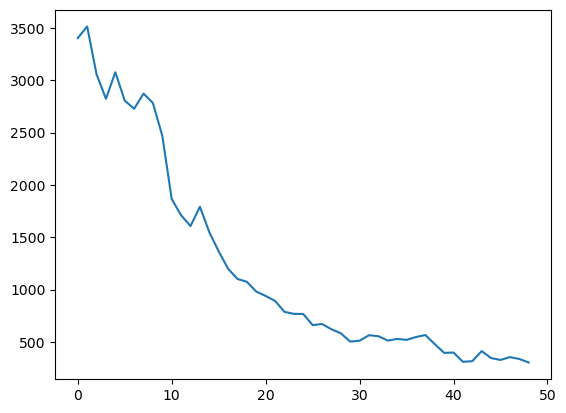

In [ ]:
%matplotlib inline
plt.figure()
plt.plot([registration_struct["registration_struct"][i]['grade'] for i in range(49)])

In [ ]:
error

array([[ 9.06733730e-01, -8.61046285e-03, -9.60440594e+05],
       [ 8.61046285e-03,  9.06733730e-01,  4.16598210e+05],
       [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]])

In [ ]:
for i, tile_dir in enumerate(tile_dirs):

        image = cv2.imread(tile_dir)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        tile_name = os.path.basename(tile_dir).split(".")[0]
        print(f"{registration_dir}/{tile_name}.tif")

        current_adjustment_mymethod = np.linalg.inv(best_adjustment) @ getMatrixFromAffine(ra_ref[i].transform)

        try:
            with rio.open(f"{registration_dir}/{tile_name}.tif", 'w',
                        driver='GTiff', count=1, dtype=np.uint8,
                        height=image.shape[0], width=image.shape[1],
                        crs=f'EPSG:3857',
                        # compress= 'CCITTFAX4',  # Use CCITTFAX4 or CCITTRLE for binary data compression
                        # transform=rio.Affine(*current_adjustment_mymethod.flatten()[:6])) as dst:
                        transform=apply_group_transform_to_tile(best_adjustment, ra_ref[i].transform, ra_refs=ra_ref)) as dst:
                            dst.write(image, 1) 
        except Exception as e:
            print(e)
            traceback.print_exc()

C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\registration/4802960025B.tif
[-10618909.42931709   3483801.60887505]
[-4729.27129581 17984.07847596]
C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\registration/4802960030B.tif
[-10618909.42931709   3483801.60887505]
[ -162.43137791 18099.39277503]
C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\registration/4802960050B.tif
[-10618909.42931709   3483801.60887505]
[-22149.79549656   8945.75002331]
C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\registration/4802960055B.tif
[-10618909.42931709   3483801.60887505]
[-11056.98947995   8993.44794618]
C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\registration/4802960060B.tif
[-10618909.42931709   3483801.60887505]
[-118.8535605

In [ ]:




corrected_affine = apply_group_transform_to_tile(
        best_adjustment,
        ra_ref[i].transform,
        ra_refs=ra_ref 
    )

[   162.43137791 -18081.60548108]
[[ 9.06733730e-01 -8.61046285e-03 -9.60440594e+05]
 [ 8.61046285e-03  9.06733730e-01  4.16598210e+05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [ ]:
getMatrixFromAffine(corrected_affine) - current_adjustment_mymethod

array([[    0.        ,     0.        ,  -140.54162351],
       [    0.        ,     0.        , -1687.8025142 ],
       [    0.        ,     0.        ,     0.        ]])

In [ ]:
f"{registration_dir}/{tile_name}.tif"

'C:\\Users\\fhacesga\\OneDrive - University Of Houston\\000_FIRMsPaper\\Validation\\input_data\\RegTiles\\run\\\\registration/4802960090B.tif'

Affine(2.0677854462806846, 0.021006382773948326, -10618961.243672414,
       0.019635962786109372, -2.2120989458191596, 3484061.0396145848)

In [ ]:
with rio.open(f"{registration_dir}/{tile_name}.tif", 'w',
                        driver='GTiff', count=1, dtype=np.uint8,
                        height=image.shape[0], width=image.shape[1],
                        crs=f'EPSG:3857',
                        # compress= 'CCITTFAX4',  # Use CCITTFAX4 or CCITTRLE for binary data compression
                        transform=corrected_affine) as dst:# rio.Affine(*corrected_affine.flatten()[:6])) as dst:
                            dst.write(image, 1) 

In [ ]:
# Paths to the source and target rasters
src_raster_path = r"D:\RECTDNN\processing\2025-01-21_17-30-34\registration\GCPs\warped\mosaic.tif"
tgt_raster_path = r"D:\RECTDNN\processing\2025-01-21_17-30-34\registration\GCPs\warped\mosaic_tester3.png"
output_raster_path  = r"C:\Users\fhacesga\OneDrive - University Of Houston\AAA_FourthChapter\000_Springboard\AAA_WEFTEC\FIRMs\Outputs\1976.tif"

# Open the source raster to read georeferencing info
with rio.open(src_raster_path) as src:
    src_transform = src.transform
    src_crs = src.crs

# Open the target raster to read data
with rio.open(tgt_raster_path) as tgt:
    tgt_data = tgt.read()  # Read all bands
    tgt_profile = tgt.profile  # Copy profile metadata

# Update profile with source georeferencing
tgt_profile.update({
    "transform": src_transform,
    "crs": src_crs
})

# Write new raster with updated georeferencing
with rio.open(output_raster_path, "w", **tgt_profile) as dst:
    dst.write(tgt_data)

04/14/2025 19:26:02 - WARNING - rasterio._env -   CPLE_NotSupported in driver PNG does not support creation option BLOCKYSIZE
04/14/2025 19:26:02 - WARNING - rasterio._env -   CPLE_NotSupported in driver PNG does not support creation option TILED
04/14/2025 19:26:02 - WARNING - rasterio._env -   CPLE_NotSupported in driver PNG does not support creation option INTERLEAVE


In [ ]:
# Paths to the source and target rasters
src_raster_path = r"C:\Users\fhacesga\OneDrive - University Of Houston\AAA_FourthChapter\000_Springboard\AAA_WEFTEC\FIRMs\Referenced1996\warped\mosaic.tif"
tgt_raster_path = r"C:\Users\fhacesga\OneDrive - University Of Houston\AAA_FourthChapter\000_Springboard\AAA_WEFTEC\FIRMs\Referenced1996\warped\mask.png"
output_raster_path  = r"C:\Users\fhacesga\OneDrive - University Of Houston\AAA_FourthChapter\000_Springboard\AAA_WEFTEC\FIRMs\Outputs\1996.tif"

# Open the source raster to read georeferencing info
with rio.open(src_raster_path) as src:
    src_transform = src.transform
    src_crs = src.crs

# Open the target raster to read data
with rio.open(tgt_raster_path) as tgt:
    tgt_data = tgt.read()  # Read all bands
    tgt_profile = tgt.profile  # Copy profile metadata

# Update profile with source georeferencing
tgt_profile.update({
    "transform": src_transform,
    "crs": src_crs
})

# Write new raster with updated georeferencing
with rio.open(output_raster_path, "w", **tgt_profile) as dst:
    dst.write(tgt_data)

04/14/2025 19:26:08 - WARNING - rasterio._env -   CPLE_NotSupported in driver PNG does not support creation option BLOCKYSIZE
04/14/2025 19:26:08 - WARNING - rasterio._env -   CPLE_NotSupported in driver PNG does not support creation option TILED


In [ ]:
    for i, tile_dir in enumerate(tile_dirs):

        image = cv2.imread(tile_dir)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        tile_name = os.path.basename(tile_dir).split(".")[0]
        print(f"{registration_dir}/{tile_name}.tif")

        current_adjustment_mymethod = np.linalg.inv(best_adjustment) @ getMatrixFromAffine(ra_ref[i].transform)

        try:
            with rio.open(f"{registration_dir}/{tile_name}.tif", 'w',
                        driver='GTiff', count=1, dtype=np.uint8,
                        height=image.shape[0], width=image.shape[1],
                        crs=f'EPSG:3857',
                        # compress= 'CCITTFAX4',  # Use CCITTFAX4 or CCITTRLE for binary data compression
                        transform=rio.Affine(*current_adjustment_mymethod.flatten()[:6])) as dst:
                            dst.write(image, 1) 
        except Exception as e:
            print(e)
            traceback.print_exc()

        try:
            with rio.open(f"{registration_dir}/{tile_name}_icp.tif", 'w',
                        driver='GTiff', count=1, dtype=np.uint8,
                        height=image.shape[0], width=image.shape[1],
                        crs=f'EPSG:3857',
                        # compress= 'CCITTFAX4',  # Use CCITTFAX4 or CCITTRLE for binary data compression
                        transform=rio.Affine(*current_adjustment.flatten()[:6])) as dst:
                            dst.write(image, 1) 
        except Exception as e:
                print(e)
                traceback.print_exc()
    
    for r in ra_ref:
        r.close()
    error

C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\registration/4802960025B.tif
name 'current_adjustment' is not defined
C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\registration/4802960030B.tif
name 'current_adjustment' is not defined


Traceback (most recent call last):
  File "C:\Users\fhacesga\AppData\Local\Temp\ipykernel_14056\721170607.py", line 29, in <module>
    transform=rio.Affine(*current_adjustment.flatten()[:6])) as dst:
NameError: name 'current_adjustment' is not defined
Traceback (most recent call last):
  File "C:\Users\fhacesga\AppData\Local\Temp\ipykernel_14056\721170607.py", line 29, in <module>
    transform=rio.Affine(*current_adjustment.flatten()[:6])) as dst:
NameError: name 'current_adjustment' is not defined


C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\registration/4802960050B.tif
name 'current_adjustment' is not defined
C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\registration/4802960055B.tif
name 'current_adjustment' is not defined


Traceback (most recent call last):
  File "C:\Users\fhacesga\AppData\Local\Temp\ipykernel_14056\721170607.py", line 29, in <module>
    transform=rio.Affine(*current_adjustment.flatten()[:6])) as dst:
NameError: name 'current_adjustment' is not defined
Traceback (most recent call last):
  File "C:\Users\fhacesga\AppData\Local\Temp\ipykernel_14056\721170607.py", line 29, in <module>
    transform=rio.Affine(*current_adjustment.flatten()[:6])) as dst:
NameError: name 'current_adjustment' is not defined


C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\registration/4802960060B.tif
name 'current_adjustment' is not defined
C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\registration/4802960080B.tif
name 'current_adjustment' is not defined


Traceback (most recent call last):
  File "C:\Users\fhacesga\AppData\Local\Temp\ipykernel_14056\721170607.py", line 29, in <module>
    transform=rio.Affine(*current_adjustment.flatten()[:6])) as dst:
NameError: name 'current_adjustment' is not defined
Traceback (most recent call last):
  File "C:\Users\fhacesga\AppData\Local\Temp\ipykernel_14056\721170607.py", line 29, in <module>
    transform=rio.Affine(*current_adjustment.flatten()[:6])) as dst:
NameError: name 'current_adjustment' is not defined


C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\registration/4802960085B.tif
name 'current_adjustment' is not defined
C:\Users\fhacesga\OneDrive - University Of Houston\000_FIRMsPaper\Validation\input_data\RegTiles\run\\registration/4802960090B.tif
name 'current_adjustment' is not defined


Traceback (most recent call last):
  File "C:\Users\fhacesga\AppData\Local\Temp\ipykernel_14056\721170607.py", line 29, in <module>
    transform=rio.Affine(*current_adjustment.flatten()[:6])) as dst:
NameError: name 'current_adjustment' is not defined
Traceback (most recent call last):
  File "C:\Users\fhacesga\AppData\Local\Temp\ipykernel_14056\721170607.py", line 29, in <module>
    transform=rio.Affine(*current_adjustment.flatten()[:6])) as dst:
NameError: name 'current_adjustment' is not defined


NameError: name 'error' is not defined

<Axes: >

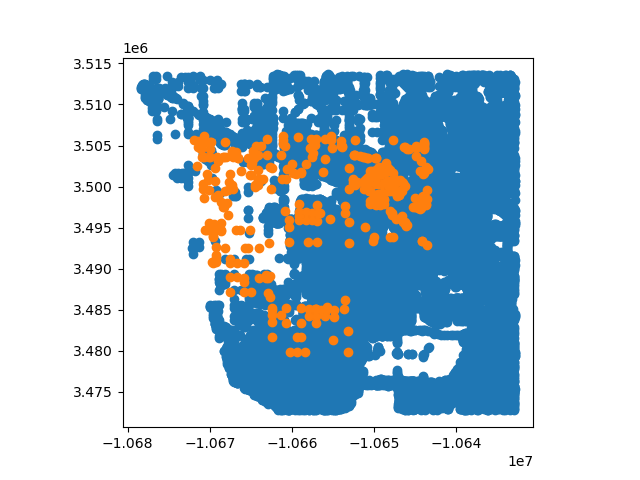

In [ ]:
fig, ax = plt.subplots()

corners_curr.plot(ax=ax)
im_corner_gdf.plot(ax=ax)

In [ ]:
with open(r'D:\RECTDNN\processing\2025-01-21_17-30-34\registration\logs\test1.pkl', 'rb') as f:
    data = pickle.load(f)

In [ ]:
cdfs = []
for ii in range(50):
    curr = []
    for i in range(len(data[ii]['matching_results'])):
        curr.append(data[ii]['matching_results'][i][2] /  data[ii]['matching_results'][i][3])

    cdfs.append(np.nanpercentile(np.array(curr), np.arange(0, 101)))

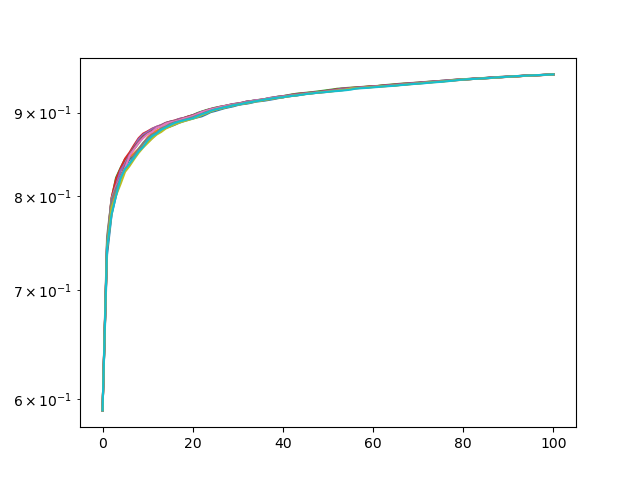

In [ ]:
fig, ax = plt.subplots()

for i in range(0, 50, 5):
    ax.plot(cdfs[i])

ax.set_yscale('log')

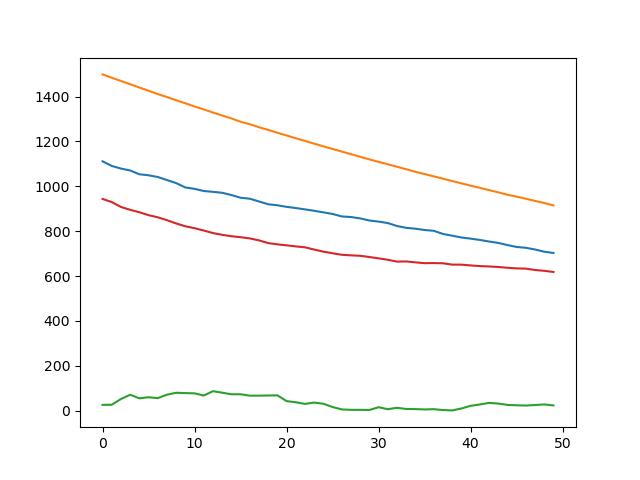

In [ ]:
fig, ax = plt.subplots()

medians = []
maxes = []
mins = []
tests = []

for i in range(50):
    medians.append(np.median(data[i]["distances"]))
    maxes.append(np.max(data[i]["distances"]))
    mins.append(np.min(data[i]["distances"]))
    tests.append(np.mean(np.sort(data[i]["distances"])[:1000]))
    



ax.plot(medians)
ax.plot(maxes)
ax.plot(mins)
ax.plot(tests)

In [ ]:
register_tile_names = glob.glob(referencing_dir + "*")

flip=np.array([
    [1, 0, 0],
    [0, -1, 0],
    [0, 0, 1]
    ]) 
    

for tile_dir in register_tile_names:


    tile_name = os.path.basename(tile_dir).split(".")[0]

    with open(f"{corner_dir}/{tile_name}.pickle", 'rb') as f:
        x = pickle.load(f)    
        corner_bbox = [a.bbox.to_xyxy() for a in x if a.score.value > 0.1]
        corner_arry = np.array([calcCenter(a) for a in corner_bbox ]) * 2
        print(f"{len(corner_bbox)} / {len(x)}")

    image = cv2.imread(tile_dir)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    ra_ref = rio.open(tile_dir)
    corner_arry = np.int32(corner_arry)                 # CONVERT TO INT32
    corner_arry = cleanCenterBBOX(corner_arry, bbox)

    # USE RASTER TRANSFORM TO GET REAL-WORLD ESTIMATES OF STREET CORNERS
    im_corner_gdf = pointsToGeodataFrame(ra_ref, corner_arry[:, 1], corner_arry[:, 0])

    bounds_poly = enlarged_bounds(ra_ref, n=2)
    corners_curr = gpd.clip(corners, bounds_poly)

    prev_transform = getMatrixFromAffine(ra_ref.transform)

    current_adjustment_mymethod, im_corner_gdf_adj = registerImagesV2(ra_ref, im_corner_gdf, corners_curr, corner_arry, descriptor_kwds,
                                        distance_threshold=5,
                                        n_iters=10,
                                        r_initial=1000, 
                                        r_change=0.8,
                                        dbscan_ini=0.02,
                                        verbose=100, logging_dir=f"{registration_dir}/logs/")

    try:
        with rio.open(f"{registration_dir}/{tile_name}.tif", 'w',
                    driver='GTiff', count=1, dtype=np.uint8,
                    height=image.shape[0], width=image.shape[1],
                    crs=f'EPSG:3857',
                    # compress= 'CCITTFAX4',  # Use CCITTFAX4 or CCITTRLE for binary data compression
                    transform=rio.Affine(*current_adjustment_mymethod.flatten()[:6])) as dst:
                        dst.write(image, 1) 
    except Exception as e:
        print(e)
        traceback.print_exc()

    icp_transform, transform_dict = performWeightedICPonTile([im_corner_gdf_adj], [corners_curr], proc_limit=5000, 
                                                          icp_iterations=100, plot_datasets=[corners_curr], weights=[1, 1/10], 
                                                          plot=True, shear=True, dist_threshold=100)
    
    current_adjustment = icp_transform @ current_adjustment_mymethod

    try:
        with rio.open(f"{registration_dir}/{tile_name}_icp.tif", 'w',
                    driver='GTiff', count=1, dtype=np.uint8,
                    height=image.shape[0], width=image.shape[1],
                    crs=f'EPSG:3857',
                    # compress= 'CCITTFAX4',  # Use CCITTFAX4 or CCITTRLE for binary data compression
                    transform=rio.Affine(*current_adjustment.flatten()[:6])) as dst:
                        dst.write(image, 1) 
    except Exception as e:
            print(e)
            traceback.print_exc()
    
    ra_ref.close()
    error

In [ ]:
logs_tile_names = glob.glob(registration_dir + "/logs/*.pkl")
out_dict = {}

for tile_name in logs_tile_names:
    with open(tile_name, 'rb') as handle:
        # pickle.dump(logging_struct, handle, protocol=pickle.HIGHEST_PROTOCOL)     
        try:
            out_dict[os.path.basename(tile_name).split(".")[0]] = pickle.load(handle)
        except:
            print("Error " + tile_name)


In [ ]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors

[(1648, 137, 0.004418225524429609, 0.0060751997355777965, array([-10621342.0444663 ,   3460631.86962922]), array([-10621335.56697867,   3460710.54192303]), array([ 40,  47, 137, 232, 388, 429, 432, 459, 709, 723, 726, 735], dtype=int64), array([137, 709, 735,  47, 388, 723, 459, 232,  40, 429, 432, 726], dtype=int64), array([0.00441823, 0.0060752 , 0.00616294, 0.00739564, 0.00745929, 0.00793723, 0.01081129, 0.0121553 , 0.01253716, 0.01326995, 0.01395699, 0.01586372])), (1666, 137, 0.008421031550850944, 0.01074072274539628, array([-10620855.99974115,   3460797.61843478]), array([-10621335.56697867,   3460710.54192303]), array([ 47, 137, 432, 723], dtype=int64), array([137, 723,  47, 432], dtype=int64), array([0.00842103, 0.01074072, 0.0123373 , 0.01902466])), (3333, 432, 0.015384825122338852, 0.020553313098006898, array([-10620422.97805392,   3460068.77992739]), array([-10621314.3531421 ,   3460040.66943466]), array([ 40, 232, 429, 432, 726], dtype=int64), array([432,  40, 429, 726, 232

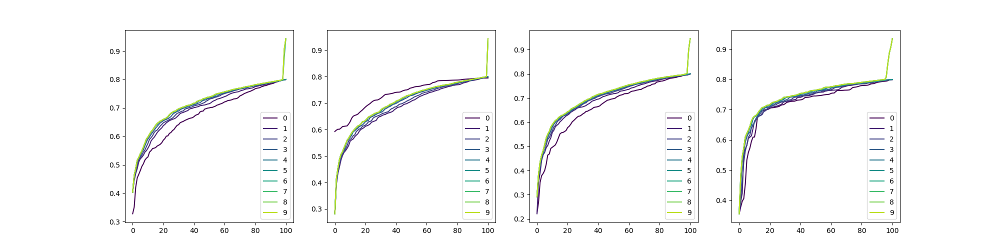

In [ ]:
fig, axs = plt.subplots(1, len(out_dict), figsize=(5*len(out_dict), 5))

for i, (k, v) in enumerate(out_dict.items()):
    cmap = cm.viridis  # Choose a colormap
    norm = mcolors.Normalize(vmin=0, vmax=len(v) - 1)

    for ii, (kk, vv) in enumerate(v.items()):
        if kk == 'registration_struct':
            continue

        pops = [a[7].shape[0]for a in vv['matching_results']]
        conf = [a[8][0] / a[8][1] for a in vv['matching_results']]

        color = cmap(norm(ii))  # Get color from colormap

        axs[i].plot(np.nanpercentile(conf, np.arange(0, 101)), color=color, label=f"{ii}")


        # fig, axs = plt.subplots(1, 2)
        # axs[0].set_title(f"Radius: {500 * 0.95 ** i:.2f}")
        # axs[0].hist(pops, bins=20, range=(0, 40))
        # axs[1].hist(conf, bins=20, range=(0, 0.8))
        # plt.show()
    axs[i].legend()

In [ ]:
def assign_and_output_rasters(selected_rasters, source_folder, output_folder):
    """
    Outputs all rasters to a specified folder, updating their projection information
    if they share the same base code as the selected rasters.
    
    Parameters:
        selected_rasters (list): List of file paths to the selected rasters.
        source_folder (str): Path to the folder containing the source rasters.
        output_folder (str): Path to the folder where updated rasters will be saved.
    """
    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)
    
    # Extract base codes and their respective affine/projection info from selected rasters
    code_to_transform = {}
    
    for raster_path in selected_rasters:
        base_code = os.path.basename(raster_path).split(".")[0][:-1]  # Remove the suffix (last character)
        
        # Read the affine transform and CRS (projection info)
        with rio.open(raster_path) as src:
            code_to_transform[base_code] = {
                "transform": src.transform,
                "crs": src.crs
            }
    
    # Iterate through all rasters in the source folder
    for raster_file in os.listdir(source_folder):
        source_path = os.path.join(source_folder, raster_file)
        
        # Skip if not a valid raster file
        if not raster_file.endswith(('.tif', '.img', '.jp2')):  # Add more extensions if needed
            continue
        
        base_code = os.path.basename(raster_file).split(".")[0][:-1]  # Extract base code
        
        # Determine the output path
        output_path = os.path.join(output_folder, raster_file)
        
        # If the raster matches a selected base code, update its projection info
        if base_code in code_to_transform:
            with rio.open(source_path) as src:
                data = src.read()  # Read all raster data
            
            # Write the raster with updated projection information
            with rio.open(
                output_path, 
                "w",
                driver=src.driver,
                height=src.height,
                width=src.width,
                count=src.count,
                dtype=src.dtypes[0],
                transform=code_to_transform[base_code]["transform"],
                crs=code_to_transform[base_code]["crs"]
            ) as dst:
                dst.write(data)
            
            print(f"Output and updated projection: {raster_file} -> {output_path}")
        else:
            # Copy the file as-is to the output folder
            with rio.open(source_path) as src:
                data = src.read()
                with rio.open(
                    output_path,
                    "w",
                    driver=src.driver,
                    height=src.height,
                    width=src.width,
                    count=src.count,
                    dtype=src.dtypes[0],
                    transform=src.transform,
                    crs=src.crs
                ) as dst:
                    dst.write(data)
            
            print(f"Output without modification: {raster_file} -> {output_path}")

In [ ]:
source_folder = r"D:\RECTDNN\processing\2024-11-15_09-31-24\registration\\"

# Example usage
"""selected_rasters = [
    f"{source_folder}4802960160C.tif",
    f"{source_folder}4802960155E.tif",
    f"{source_folder}4802960175D.tif"

]"""

"""selected_rasters = [
    f"{source_folder}4802960150D.tif",
    f"{source_folder}4802960080D.tif",
    f"{source_folder}4802960090B.tif"

]"""

selected_rasters = [
    f"{source_folder}4802960085D.tif",
    f"{source_folder}4802960115D.tif",
    f"{source_folder}4802960120C.tif",
    f"{source_folder}4802960125B.tif"

]

output_folder = r"D:\RECTDNN\processing\2024-11-15_09-31-24\registration_homo\\"

assign_and_output_rasters(selected_rasters, source_folder, output_folder)

12/09/2024 09:20:16 - INFO - rasterio._env -   GDAL signalled an error: err_no=4, msg='D:/RECTDNN/processing/2024-11-15_09-31-24/registration/4802960085D.tif: No such file or directory'


RasterioIOError: D:/RECTDNN/processing/2024-11-15_09-31-24/registration/4802960085D.tif: No such file or directory

In [ ]:
def bboxTransformToCRS(transform, image):
    rev_y_axis = np.array([[1, 0, 0],
                        [0,-1, 0],
                        [0, 0, 1]])
    
    translation = np.eye(3)
    translation[1, 2] = image.shape[0]

    return transform @ translation @ rev_y_axis


def bbox_to_coords_realworld(bbox):
    # BOUNDING BOX 

    x_min, y_min, x_max, y_max = bbox

    xs = [x_min, x_min, x_max, x_max]
    ys = [y_max, y_min, y_min, y_max]
    return xs, ys

def bbox_to_coords_raster(bbox):
    # BOUNDING BOX 

    x_min, y_min, x_max, y_max = bbox

    xs = [x_min, x_min, x_max, x_max]
    ys = [y_min, y_max, y_max, y_min]
    return xs, ys

bad = 0
RLNN = None

tile_coords = {}
debug_struct = {}

referencing_dir = os.path.join(proc_dir, "referencing")
os.makedirs(referencing_dir, exist_ok=True)

detected_tiles['reference_name'] = detected_tiles.index
list_tiles = list(detected_tiles_gdf.index)

# THERE'S AN ISSUE WITH PERFECT MATCHES ON SHORTER STRINGS. 
# (IE 48035 PERFECT FOR 48035001A, WHEN WE'RE LOOKING FOR 48035001)
# TO DEAL WITH IT, WE ONLY COMPARE AGAINST STRINGS OF A CERTAIN LENGTH 
# (SEE HEURISTICALLY-DETERMINED COMP_LENGTH BELOW)
# THIS STRUCTURE CONTAINS ALL POSSIBLE LENGTHS NEEDED, 
# SAVING APPROX 33% TIME INSTEAD OF DYNAMICALLY SHORTENING ALL STRINGS
curr_tile_name_length_dict = {}
bn_lengths = np.array([len(a) for a in tiles_bns])              # LENGTH OF BASENAMES FOR ALL TILES BEING USED
for i in range(np.min(bn_lengths) - 3, np.max(bn_lengths+3)):   # FOR A RANGE AROUND THAT BASE LENGTH
    curr_tile_name_length_dict[i] = [a if i <= len(a) else "" for a in list_tiles]

for i, tile in tqdm(enumerate(tiles), total=len(tiles)):

    comp_length = len(tiles_bns[i]) - 2

    # KEEP NUMERIC PART OF TILE NAME
    p = re.sub(r"[^0-9]", "", os.path.basename(tile))

    # PERFORM MATCHING
    match, score = process.extractOne(tiles_bns[i], curr_tile_name_length_dict[comp_length])
    matches = process.extract(tiles_bns[i], curr_tile_name_length_dict[comp_length])
    out_fn = os.path.join(referencing_dir, tiles_bns[i] + ".tif")
    
    if score >= 90:
        image = np.asarray(Image.open(tile))

        # IF IMAGE IS NOT UINT8, CONVERT
        if np.max(image) < 255:
            image = image * 255
            image = image.astype(np.uint8)

        tile_coords[out_fn] = detected_tiles.loc[match]
        tile_coords[out_fn]['input_file'] = tile

        bounds, RLNN = findBounds(tile, RLNN)
        
        if len(bounds[0]) < 1:
            print(f"COULD NOT FIND BOUNDS, USING IMAGE EXTENTS {tile}")
            
            bbox = [0, 0, image.shape[0], image.shape[1]]
        else:
            bbox = bounds[0].boxes.xyxy.numpy().astype(np.int32)[0].flatten()
        
        real_x, real_y = bbox_to_coords_realworld(tile_coords[out_fn]["coords"])
        pic_x, pic_y   = bbox_to_coords_raster(bbox)

        affine = affineTransformation(pic_x, pic_y, real_x, real_y)
        transform = bboxTransformToCRS(affine.matrix, image)

        debug_struct[out_fn] = {
            "match"  : match,  "basename" : tiles_bns[i],
            "matches": matches, "bbox" : bbox,
            "real_x" : real_x, "real_y" : real_y,
            "pic_x"  : pic_x,  "pic_y"  : pic_y,
            "affine" : affine, "transform" : transform
        }
        try:
            with rio.open(out_fn, 'w',
                driver='GTiff', count=1, dtype=image.dtype,
                height=image.shape[0], width=image.shape[1],
                crs=f'EPSG:3857',
                transform=rio.Affine(*transform.flatten()[:6])) as dst:
                    dst.write(image, 1) 
        except: 
            print(f"Could not save {tiles_bns[i]}")
                
    else:
        tile_coords[out_fn] = None
        print(f"Skipping {out_fn}")
        print(matches)
        debug_struct[out_fn] = {
            "match"  : match,  "basename" : tiles_bns[i],
            "matches": matches,
        }
        bad = bad + 1

  0%|          | 0/599 [00:00<?, ?it/s]

Skipping D:\RECTDNN\processing\2024-10-11_15-08-46\\referencing\480287B_2.tif
[('480287_1', 82), ('4802870_1', 78), ('4802870', 75), ('4802870325', 74), ('4802870200', 74)]
Skipping D:\RECTDNN\processing\2024-10-11_15-08-46\\referencing\480287B_45.tif
[('4802870425', 80), ('4802870450', 80), ('4802870475', 80), ('4802870145', 80), ('4802870465', 80)]
Skipping D:\RECTDNN\processing\2024-10-11_15-08-46\\referencing\480287B_25.tif
[('4802870325', 80), ('4802870425', 80), ('4802870525', 80), ('4802870250', 80), ('4802870225', 80)]
Skipping D:\RECTDNN\processing\2024-10-11_15-08-46\\referencing\480287B_34.tif
[('4802870345', 80), ('4802870340', 80), ('48028703', 78), ('480287_1', 78), ('4802870_1', 74)]
Skipping D:\RECTDNN\processing\2024-10-11_15-08-46\\referencing\480287B_53.tif
[('4802870530', 80), ('48028703', 78), ('480287_1', 78), ('48028705360', 76), ('480287165', 74)]
Skipping D:\RECTDNN\processing\2024-10-11_15-08-46\\referencing\480287B_16.tif
[('480287_1', 89), ('480287165', 84),

  0%|          | 0/300 [00:00<?, ?it/s]

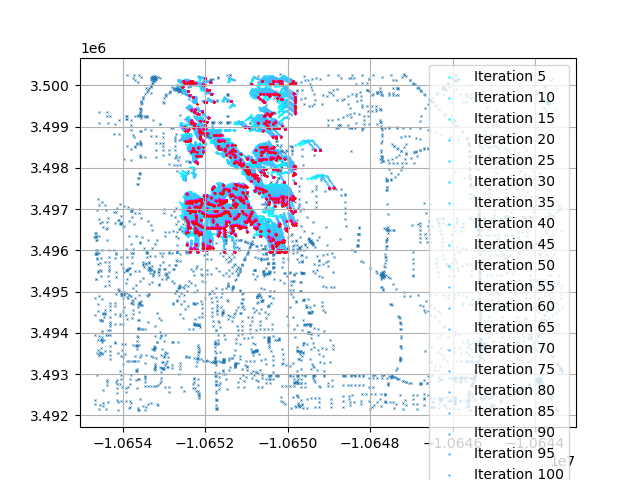

10/17/2024 16:55:43 - INFO - rasterio._env -   GDAL signalled an error: err_no=1, msg='Deleting D:/RECTDNN/processing/2024-10-11_15-08-46/48201C0420M_registered6.tif failed:\nPermission denied'


Could not save photo D:\RECTDNN\processing\2024-10-11_15-08-46\\referencing\48201C0420M.tif


  0%|          | 0/300 [00:00<?, ?it/s]

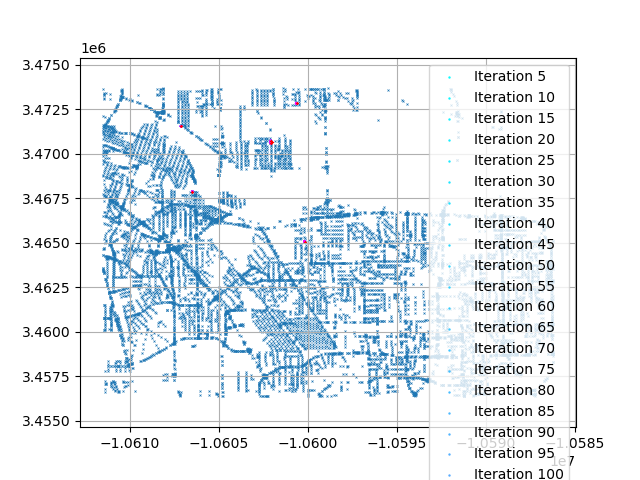

  0%|          | 0/300 [00:00<?, ?it/s]

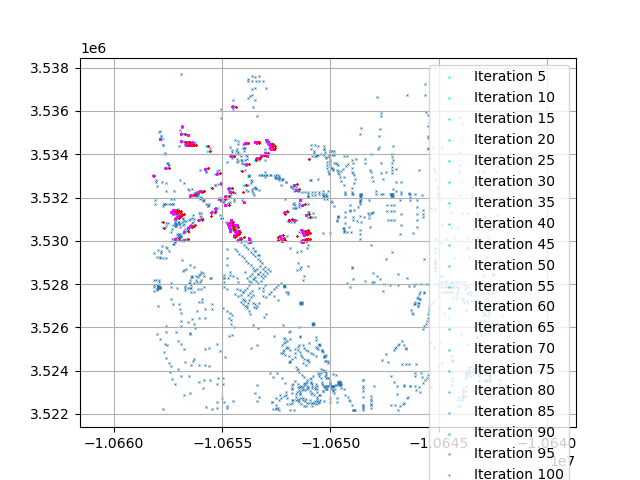

  0%|          | 0/300 [00:00<?, ?it/s]

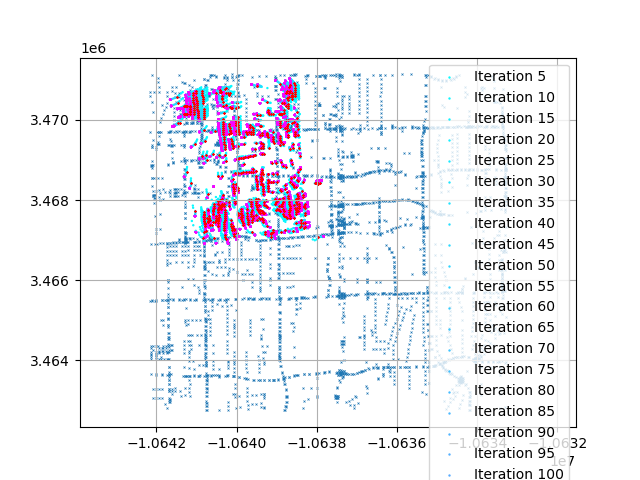

  0%|          | 0/300 [00:00<?, ?it/s]

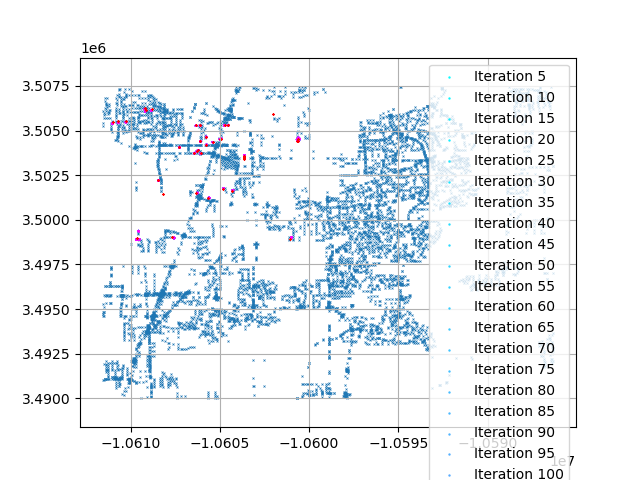

  0%|          | 0/300 [00:00<?, ?it/s]

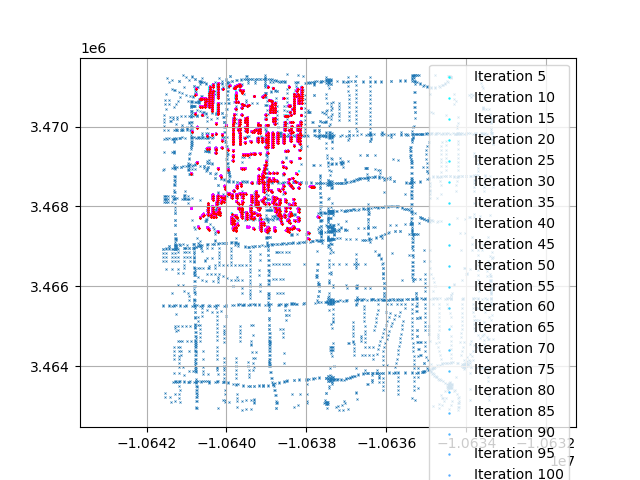

  0%|          | 0/300 [00:00<?, ?it/s]

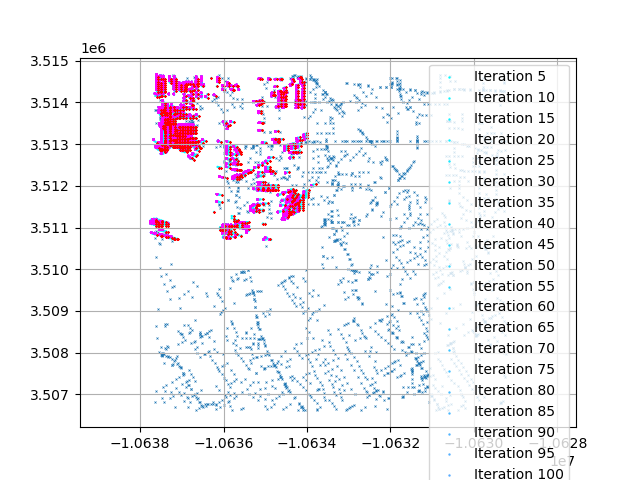

  0%|          | 0/300 [00:00<?, ?it/s]

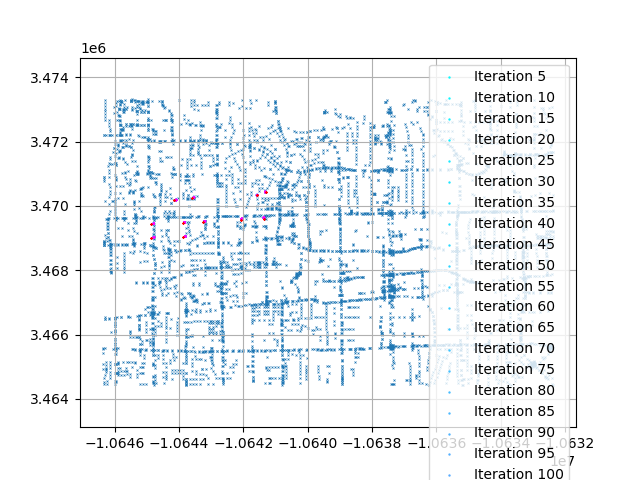

  0%|          | 0/300 [00:00<?, ?it/s]

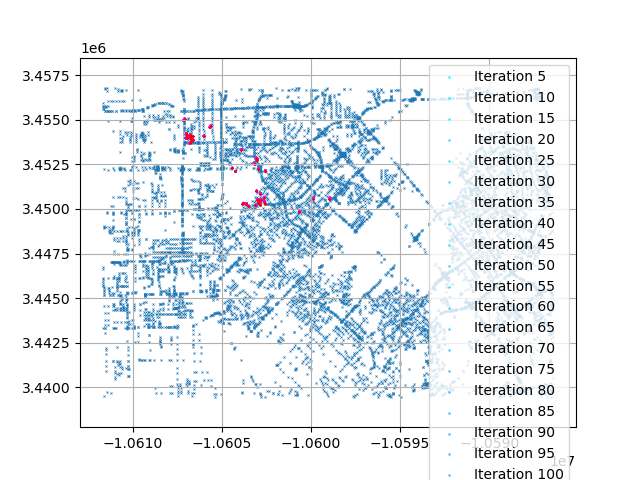

  0%|          | 0/300 [00:00<?, ?it/s]

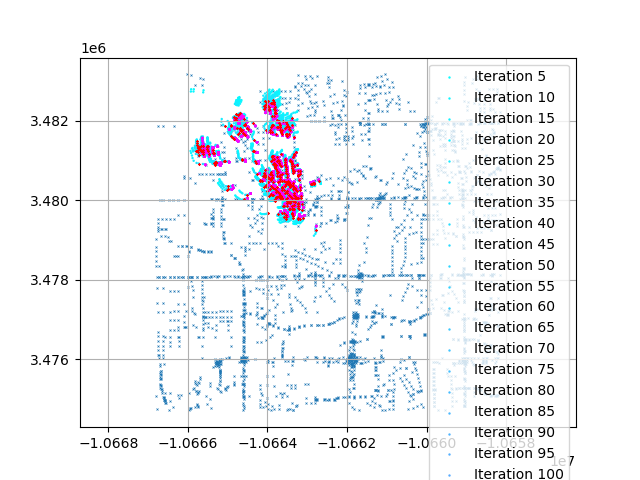

  0%|          | 0/300 [00:00<?, ?it/s]

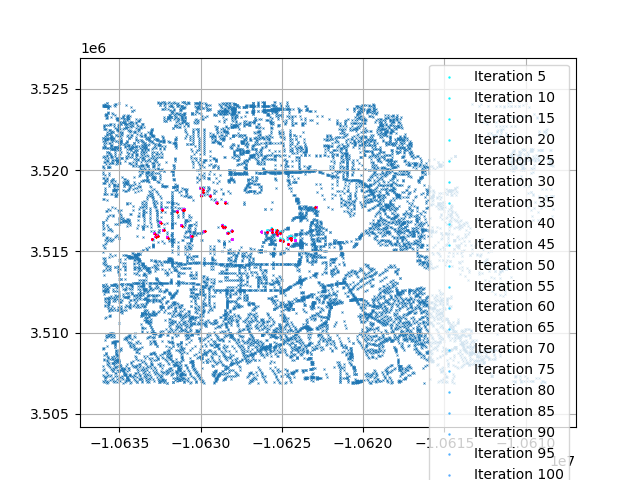

  0%|          | 0/300 [00:00<?, ?it/s]

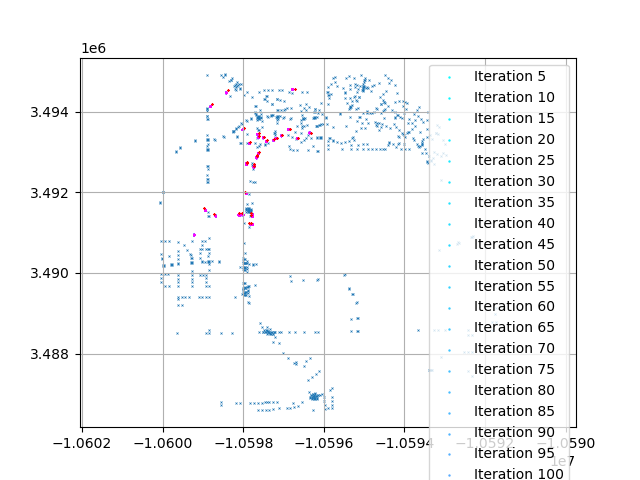

  0%|          | 0/300 [00:00<?, ?it/s]

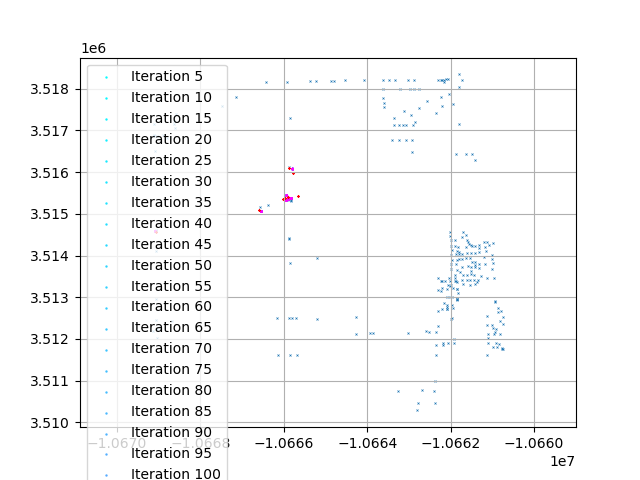

  0%|          | 0/300 [00:00<?, ?it/s]

ValueError: need at least one array to concatenate

In [ ]:
bestgrades = []
numcorners = []

allgrades = []

model = TPNN(num_classes=2, finalpadding=1, inputsize=2)
checkpoint = torch.load(r'C:\Users\fhacesga\OneDrive - University Of Houston\AAA_RECTDNN\data/FANN/checkpoint_101123.pth')
model.load_state_dict(checkpoint['model_state_dict'])
model = model.to('cuda')

for i, (out_name, db) in enumerate(tile_coords.items()):
    if db is not None:

        # try:
        
            # OPEN RASTER AND GET BOUNDING BOX
            ra = rio.open(out_name)
            bounds  = ra.bounds
            image   = ra.read(1)

            # VALID BBOX FOR OBSERVATIONS OF ROADS
            bbox = debug_struct[out_name]['bbox']

            '''
            # RUN ROADS DETECTION ON CNN AND PREP FOR ICP
            roads, _    = split_and_run_cnn(image, model, tilesize=1024, num_dim=3, edges=10, dims_rep=[0], n_pyramids=2, device="cuda", verbose=True)
            roads_thin  = roads[:, :, 1] > 0.95
            roads_thin  = cleanImageBBOX(roads_thin, bbox)
            roads_thin  = skeletonize(roads_thin)    # USE SKELETONIZATION ALGORITHM TO THIN ROADS
            y, x        = np.where(roads_thin[:, :])            # GET X, Y COORDINATES OF IDENTIFIED ROAD POINTS
            street_det  = pointsToGeodataFrame(ra, y, x)        # CONVERT X, Y COORDINATES TO GDF AND REPROEJCT TO CURRENT ESTIMATE OF RASTER POSITION

            # USING CURRENT ENLARGED RASTER EXTENTS, GET RELEVANT ROADS FROM OPENSTREETMAP FILE
            bounds_poly = enlarged_bounds(ra, n=1)              # ENLARGED EXTENTS - NOTE, SET TO 1 (NO ENLARGEMENT) BECAUSE I'M NOT SURE HOW NEEDED THIS IS
            roads_clipped = gpd.clip(roads_gdf, bounds_poly)    # CLIP
            streets = getRoadPoints(roads_clipped, 0.5)         # ROAD POINTS ALONG STREETS, 0.5 IN M
            '''

            # RUN YOLO DETECTION ON STREET INTERSECTIONS AND PREP FOR DATASET
            # corner_bbox = [street_corners[a]['bbox'] for a in street_corners]
            # corner_arry = np.array([calcCenter(a) for a in corner_bbox ]) 
            # GET STREET CORNERS FROM TPNN OUTPUTS
            corner_arry = streetcorner_dict[os.path.basename(out_name).split(".")[0] + ".pickle"]# streetresults_struct[tile_coords[out_name]['input_file']]
            corner_arry = np.int32(corner_arry)                 # CONVERT TO INT32
            corner_arry = cleanCenterBBOX(corner_arry, bbox)

            # USE RASTER TRANSFORM TO GET REAL-WORLD ESTIMATES OF STREET CORNERS
            corner_gdf = pointsToGeodataFrame(ra, corner_arry[:, 1], corner_arry[:, 0])
            
            # GET SHAPEFILE OF STREET INTERSECTIONS
            bounds_poly = enlarged_bounds(ra, n=1)              # ENLARGED EXTENTS - NOTE, SET TO 1 (NO ENLARGEMENT) BECAUSE I'M NOT SURE HOW NEEDED THIS IS
            corners = gpd.clip(intersections, bounds_poly)
            
            # DEFINE OUTPUT FILENAME
            ICP_fn = os.path.join(proc_dir, os.path.basename(out_name).split(".")[0] + "_ICP.tif")
            
            # ACTUALLY PERFORM ICP AND SAVE OUTPUT GRADE
            # best_transform, transform_dict = performICPonTile(detections, streets, plot=True, save_fig=ICP_fn, icp_iterations=500, conv=1e-6)
            # best_transform, transform_dict = performICPonTile(detections, streets, plot=True, icp_iterations=50, conv=1e-6, rotation_limit=20)
            # out = performWeightedICPonTile([street_det, corner_gdf], [streets, corners], weights=[1, 1/50])
            # best_transform, transform_dict = performWeightedICPonTile([street_det, corner_gdf], [streets, corners],proc_limit=200, icp_iterations=90, plot_datasets=[roads_clipped, corners], weights=[1, 1/10], plot=False, shear=True )
            best_transform, transform_dict = performWeightedICPonTile([corner_gdf], [corners], proc_limit=5000, icp_iterations=300, plot_datasets=[corners], weights=[1, 1/10], plot=True, shear=True, dist_threshold=1000, )
            
            bestgrades.append(np.min(transform_dict['grades']))

            # SAVE WITH REGISTRATION
            raster_name = os.path.join(proc_dir, os.path.basename(out_name).split(".")[0] + "_registered6.tif")
            transform = best_transform @ getMatrixFromAffine(ra.transform) 
            
            # SAVE POINTS USED FOR ESTIMATION
            shp_name = os.path.join(proc_dir, os.path.basename(out_name).split(".")[0] + "_XY.gpkg")
            a = gpd.GeoDataFrame(crs="EPSG:3857", geometry=gpd.points_from_xy(transform_dict['reproj'][0][:, 0], transform_dict['reproj'][0][:, 1]))
            a.to_file(shp_name)

            # SAVE ANCILLARY FILES
            out_struct = {
                "best_transform" : best_transform,
                "transform_dict" : transform_dict,
            }

            allgrades.append(transform_dict)
            
            try:
                with rio.open(raster_name, 'w',
                    driver='GTiff', count=1, dtype=np.uint8,
                    height=image.shape[0], width=image.shape[1],
                    crs=f'EPSG:3857',
                    transform=rio.Affine(*transform.flatten()[:6])) as dst:
                        dst.write(image, 1) 
                        # dst.write(roads_thin * 255, 2) 
                        # dst.write(draw_bounding_boxes(corner_bbox, image.shape[:2]), 3) 

                with open(raster_name[:-4] + ".pkl", 'wb') as handle:
                    pickle.dump(out_struct, handle, protocol=pickle.HIGHEST_PROTOCOL)

            except:
                print(f"Could not save photo {out_name}")
        #except:
        #    print(f"Error with {out_name}")
        #    continue

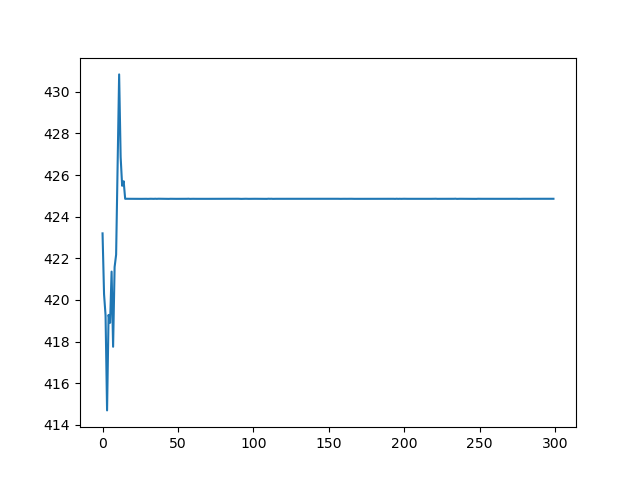

In [ ]:
plt.figure()
plt.plot(out_struct['transform_dict']['grades'])

In [ ]:
image.dtype

dtype('uint8')

In [ ]:
'''FANN_prior = None
RLNN_prior = None
model = None

color=False

plot_params = {"labels" : False, }
YOLO_params = {
    "device"  : "cuda",     "find_text" : False, 
    "keyed_text"  : False,  "verbose" : False,  "get_data"  : False,
    "target_size" : 1920,   "plot_params" : plot_params, "ret_values" : True
}

# IF WE'VE ALREADY STARTED PROCESSING THINGS, LOAD STATE DICT
if os.path.exists(f'{proc_dir}results.pkl'):
    print("FOUND DICTIONARY, LOADING")
    with open(f'{proc_dir}results.pkl', 'rb') as handle:
        results_struct = pickle.load(handle)
else:
    results_struct = {}

# LOOP FOR EACH TILE
for i, tile in tqdm(enumerate(tiles), total=len(tiles)):
    
    # DEFINE WHERE GEOREFERENCED TILE IS SAVED
    out_fn = os.path.join(proc_dir, os.path.basename(tile).split(".")[0] + "_FANN.png")
    fin_fn = os.path.join(proc_dir, os.path.basename(tile).split(".")[0] + "_results.pkl")

    # HAVE WE ALREADY PROCESSED THIS TILE? IF SO, SKIP
    if results_struct.get(tile, None):
        # print(f"Found in dict, skipping {tile}")
        continue

    # WHICH VERSION OF FANN ARE WE USING
    if color:
        # RUN AND SAVE PREPROCESSING FANN AND RLNN
        prepped_fn = os.path.join(proc_dir, os.path.basename(tile).split(".")[0] + "_prepped.png")                      # FILE NAME
        prepped, FANN_prior, RLNN_prior, bounds = findStreetCorners_colorPrep(tile, FANN=FANN_prior, RLNN=RLNN_prior)   # RUN FANN_PRIOR AND RLNN
        Image.fromarray(prepped).save(prepped_fn) # SAVE

        # RUN FANN
        results, model, base = runYOLO_Text(prepped_fn, model=model, model_weights=f"{data_dir}FANN/YOLO/051624.pt", **YOLO_params)
        
    else:
        bounds = None

        # RUN FANN
        results, model, base = runYOLO_Text(tile, model=model, model_weights=f"{data_dir}FANN/YOLO/051624_bw.pt", **YOLO_params)

    results_struct[tile] = results
    
    '' IF YOU WANT TO SAVE DETAILED OUTPUT, THIS CODE WORKS, BUT IT'S HELLA SLOW AND BURDENSOME
    temp_dict = {"results" : results, "bounds" : bounds, "results_2" : base}
    results_struct[tile] = fin_fn
    if os.path.exists(fin_fn):
        os.remove(fin_fn)
    with open(fin_fn, 'wb') as handle:
        pickle.dump(temp_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)
    ''

    
    # SAVE EVERY N ITERATIONS AND LAST
    if i % 60 == 0 or i == len(tiles) - 1:
        file_path = f'{proc_dir}results.pkl'
        if os.path.exists(file_path):
            os.remove(file_path)
        with open(file_path, 'wb') as handle:
            pickle.dump(results_struct, handle, protocol=pickle.HIGHEST_PROTOCOL)
    '''